In [1]:
import pandas as pd
import numpy as np
import numbers

In [2]:
def find_roundest_ellipse_in_df(df):
    s = df.ratio2
    closest_ind = np.nanargmin(np.abs(s - 1))  # find the index of the value closest to 1
    return int(closest_ind)

def kerr(df, aEC = np.nan, bEC = np.nan):
    if aEC != aEC:
        idx = find_roundest_ellipse_in_df(df)
        dx = df.loc[df.index[idx],'center_x']
        dy = df.loc[df.index[idx],'center_y']
        if not isinstance(dx, numbers.Number):
            dx = dx.iloc[0]
        if not isinstance(dy, numbers.Number):
            dy = dy.iloc[0]
        aEC = int(dx)
        bEC = int(dy)

    theta_values = np.full(len(df), np.nan)  # Initialize theta column with NaNs
    phi_values = np.full(len(df), np.nan)  # Initialize phi column with NaNs
    r_values = np.full(len(df), np.nan)  # Initialize r column with NaNs

    # Convert columns to NumPy arrays for faster access
    hw_values = df['ratio2'].values
    aPC_values = df['center_x'].values
    bPC_values = df['center_y'].values

    # Mask for valid `hw` values (to ignore NaNs)
    valid_mask = ~np.isnan(hw_values)

    # Vectorized computation for `top` and `bot`
    sqrt_component = np.sqrt(1 - hw_values[valid_mask]**2)
    distances = np.sqrt((aPC_values[valid_mask] - aEC)**2 + (bPC_values[valid_mask] - bEC)**2)

    top_values = sqrt_component * distances
    bot_values = (1 - hw_values[valid_mask]**2)

    top = np.sum(top_values)
    bot = np.sum(bot_values)

    f_z = top / bot

    # Compute `r` for all rows where `major_ax` is valid
    valid_major_ax = ~np.isnan(df['major_ax'].values)
    max_axes = np.maximum(df['major_ax'].values, df['minor_ax'].values)
    r_values[valid_major_ax]  = (2 * max_axes[valid_major_ax]) / f_z

    # Compute `theta` and `phi` in a vectorized way
    valid_positions = ~np.isnan(aPC_values) & ~np.isnan(bPC_values)

    # p1 = (aPC_values[valid_positions] - aEC)
    # p = p1/f_z
    comp_p = np.arcsin((aPC_values[valid_positions] - aEC) / f_z)

    # t1 = (bPC_values[valid_positions] - bEC)
    # t2 =  (np.cos(comp_p) * f_z)
    # t = t1/t2
    comp_t = np.arcsin((bPC_values[valid_positions] - bEC) / (np.cos(comp_p) * f_z))

    theta_values[valid_positions] = np.degrees(comp_t)
    phi_values[valid_positions] = np.degrees(comp_p)

    # Create output DataFrame
    output_df = pd.DataFrame({'r': r_values, 'theta': theta_values, 'phi': phi_values}, index=df.index)
    output_df = pd.concat([df[['frame', 'x_angle','y_angle','ratio2','ratio1']],output_df], axis=1)
    return f_z, output_df #, valid_mask, valid_major_ax, valid_positions

In [3]:
sim_df = pd.read_csv(r'Z:\Nimrod\3D_calibration\eye_ellipse_map_diameter_8mm_distance_13mm\ellipse_angle_mapping_correct_diameter_08mm_distance_13mm.csv', index_col=0)
sim_df['major_ax'] = np.maximum(sim_df['axs_1'], sim_df['axs_2'])
sim_df['minor_ax'] = np.minimum(sim_df['axs_1'], sim_df['axs_2'])
sim_df['ratio2'] = sim_df['minor_ax'] / sim_df['major_ax']
sim_df['ratio1'] =  sim_df['major_ax']/sim_df['minor_ax']
_,kerr_df = kerr(sim_df,aEC=640//2, bEC=480//2)

<ipython-input-2-462c7f5326de>:57: RuntimeWarning: invalid value encountered in arcsin
  comp_t = np.arcsin((bPC_values[valid_positions] - bEC) / (np.cos(comp_p) * f_z))


Saved PDF → Z:\\Nimrod\\Paper_Figures\\2024_Personalized_headstage_eye_tracking\\supplementary\\kerr_accuracy_report_span60_ylim0_25.pdf
k=70°  →  R=35.00°  →  ratio@R≈0.761
Within-span (r≤R) mean error: 3.242°  (n=4088)


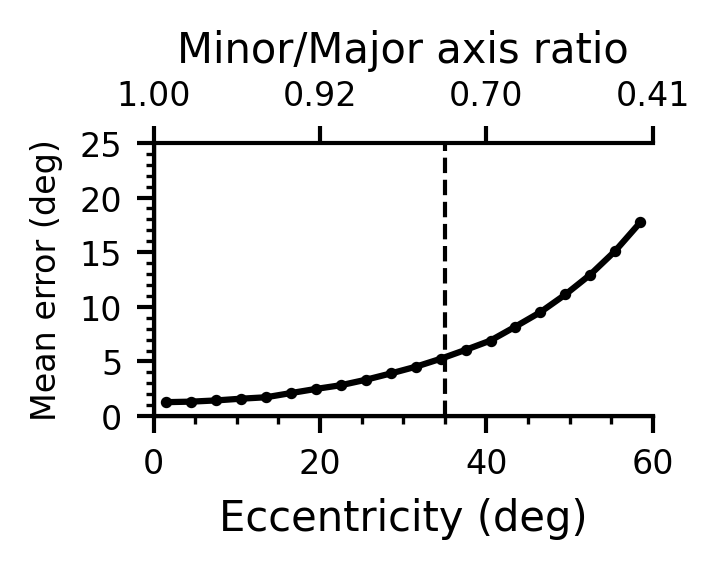

In [4]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

def plot_error_vs_ecc_with_ratio_axis_pdf(
    df,
    k=40,                         # span (deg) -> vertical line at R=k/2 on bottom axis
    metric="total",               # "total" | "phi" | "theta"
    r_bins=30,                    # number of eccentricity bins (x points are bin centers)
    r_range=None,                 # (r_min, r_max) in deg for bottom axis, e.g. (0, 60)
    min_per_bin=20,               # drop curve bins with < this many samples
    ring_halfwidth_deg=0.5,       # for reporting ratio at the span ring (optional)
    figsize=(3.8, 2.6),
    dpi=300,
    export_pdf_path=None,
    font_family="Arial",
    y_range=None
):
    """
    Mean angular error vs eccentricity (bottom x-axis in degrees), with a top x-axis
    showing the corresponding ratio (minor/major) learned from the dataset.

    • Curve is computed by binning on eccentricity r = hypot(x_angle, y_angle).
      Each plotted point is the mean error in one r-bin, placed at that bin's CENTER.
    • Bottom x-axis extent is controlled via r_range=(r_min, r_max) in degrees.
    • The dashed vertical line is drawn at R = k/2 on the degree axis.
    • The top x-axis labels (ratio) are computed from the dataset by taking the
      median ratio in each r-bin and interpolating to the bottom tick positions.
    • PDF export uses TrueType fonts (editable text); Arial if available.
    """
    # ---------- Fonts (editable text in PDF) ----------
    from matplotlib import rcParams
    %matplotlib inline
    plt.style.use('default')
    rcParams['pdf.fonttype'] = 42  # Ensure fonts are embedded and editable
    rcParams['ps.fonttype'] = 42  # Ensure compatibility with vector outputs

    # ---------- Data prep ----------
    req = {"ratio2","x_angle","y_angle","phi","theta"}
    missing = req - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing required columns: {missing}")

    d = df[list(req)].copy().dropna(subset=list(req))
    d["ratio2"] = pd.to_numeric(d["ratio2"], errors="coerce").clip(0.0, 1.0)
    d = d.dropna(subset=["ratio2"])
    d["r_xy"] = np.hypot(d["x_angle"], d["y_angle"])

    # Errors
    d["err_phi"]   = d["phi"]   - d["x_angle"]
    d["err_theta"] = d["theta"] - d["y_angle"]
    if metric == "total":
        d["error"] = np.sqrt(d["err_phi"]**2 + d["err_theta"]**2)
        ylab = "Mean error (deg)"
    elif metric == "phi":
        d["error"] = np.abs(d["err_phi"])
        ylab = "Mean |φ − x_angle| (deg)"
    elif metric == "theta":
        d["error"] = np.abs(d["err_theta"])
        ylab = "Mean |θ − y_angle| (deg)"
    else:
        raise ValueError("metric must be 'total', 'phi', or 'theta'")

    # ---------- Eccentricity binning for the curve ----------
    # Decide axis limits in degrees
    if r_range is None:
        r_min = float(np.nanmin(d["r_xy"]))
        r_max = float(np.nanmax(d["r_xy"]))
    else:
        r_min, r_max = map(float, r_range)

    # Build r-bins across the requested extent (even if edges are empty)
    r_edges = np.linspace(r_min, r_max, int(r_bins) + 1)
    r_cats  = pd.cut(d["r_xy"], r_edges, include_lowest=True)
    centers_r = np.array([iv.mid for iv in r_cats.cat.categories])

    # Aggregate per r-bin: mean error, n, and median ratio (for top-axis mapping)
    gb = d.groupby(r_cats, observed=False).agg(
        mean_error=("error","mean"),
        n=("error","size"),
        ratio_med=("ratio2","median"),
    ).reset_index(drop=True)
    gb = gb.assign(r_center=centers_r)

    # Curve points (drop sparse bins)
    curve = gb[gb["n"] >= int(min_per_bin)].copy()

    # ---------- Span line at R = k/2 (degrees) ----------
    R = float(k) / 2.0

    # For reporting only: dataset-based ratio at that ring (use ring or fallback to interp)
    ring_mask = np.abs(d["r_xy"] - R) <= float(ring_halfwidth_deg)
    if ring_mask.any():
        ratio_at_R = float(d.loc[ring_mask, "ratio2"].mean())
    else:
        # Fallback: interpolate from r-bin medians
        valid = gb["n"].to_numpy() > 0
        ratio_at_R = float(np.interp(R, gb.loc[valid, "r_center"], gb.loc[valid, "ratio_med"]))

    # ---------- Plot ----------
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    # Draw the curve (points are at r-bin CENTERS)
    ax.plot(curve["r_center"], curve["mean_error"], linewidth=1.5, color="black")
    ax.scatter(curve["r_center"], curve['mean_error'],s=3,color='black')

    # Bottom axis (degrees)
    if y_range is not None: ax.set_ylim(*y_range)
    ax.set_xlim(r_min, r_max)
    ax.set_xlabel("Eccentricity (deg)", fontsize=10)
    ax.set_ylabel(ylab, fontsize=8)
    ax.tick_params(axis="both", labelsize=8, width=1.0, length=4, direction="out")
    ax.minorticks_on()
    ax.tick_params(axis="both", which="minor", width=0.8, length=2, direction="out")
    ax.yaxis.set_major_locator(MaxNLocator(5))
    for spine in ("left","bottom"):
        ax.spines[spine].set_visible(True); ax.spines[spine].set_linewidth(1.0)
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

    # Vertical span line at R (degrees)
    ax.axvline(R, linestyle="--", linewidth=1.0, color="black")

    # Top x-axis: ratio at the same degree ticks
    ax_top = ax.twiny()
    ax_top.set_xlim(ax.get_xlim())  # share transform
    # Use the actual bottom ticks so both axes align
    bottom_ticks = ax.get_xticks()
    # Interpolate ratio from r_center → ratio_med over bins with data
    valid_map = gb["n"].to_numpy() > 0
    r_map  = gb.loc[valid_map, "r_center"].to_numpy()
    q_map  = gb.loc[valid_map, "ratio_med"].to_numpy()
    ratio_labels = np.interp(bottom_ticks, r_map, q_map,
                             left=q_map[0] if q_map.size else np.nan,
                             right=q_map[-1] if q_map.size else np.nan)
    ax_top.set_xticks(bottom_ticks)
    ax_top.set_xticklabels([f"{v:.2f}" if np.isfinite(v) else "" for v in ratio_labels], fontsize=8)
    ax_top.set_xlabel("Minor/Major axis ratio", fontsize=10)
    ax_top.tick_params(axis="x", width=1.0, length=4, direction="out")
    ax_top.spines["top"].set_visible(True); ax_top.spines["top"].set_linewidth(1.0)
    ax_top.spines["right"].set_visible(False)

    plt.tight_layout()

    # ---------- Export ----------
    if export_pdf_path:
        fig.savefig(export_pdf_path, bbox_inches="tight")
        print(f"Saved PDF → {export_pdf_path}")

    # ---------- Brief report ----------
    in_span = d["r_xy"] <= R

    mean_span = float(d.loc[in_span, "error"].mean()) if in_span.any() else np.nan

    print(f"k={k:g}°  →  R={R:.2f}°  →  ratio@R≈{ratio_at_R:.3f}")
    print(f"Within-span (r≤R) mean error: {mean_span:.3f}°  (n={int(in_span.sum())})")

    return {
        "curve": curve[["r_center","mean_error","n","ratio_med"]].reset_index(drop=True),
        "r_limits": (r_min, r_max),
        "R": R,
        "ratio_at_R": ratio_at_R,
        "within_span_mean": mean_span,
    }

export_path = r'Z:\\Nimrod\\Paper_Figures\\2024_Personalized_headstage_eye_tracking\\supplementary\\kerr_accuracy_report_span60_ylim0_25.pdf'
out = plot_error_vs_ecc_with_ratio_axis_pdf(
    kerr_df,
    k=70,
    metric="total",
    r_bins=20,
    r_range=(0, 60),            # force 0..60° on bottom axis
    min_per_bin=0,
    ring_halfwidth_deg=0.5,
    figsize=(2.5, 2),
    dpi=300,
    export_pdf_path=export_path,
    font_family="Arial",
    y_range=(0,25)
)


In [8]:
kerr_df

,frame,x_angle,y_angle,ratio2,ratio1,r,theta,phi
0,0,-60.000002,-60.000002,0.084199,11.876655,2.784120,NaN,-27.769258
1,1,-59.000001,-60.000002,0.092396,10.822934,2.831230,NaN,-27.563676
2,2,-57.999999,-60.000002,0.098392,10.163395,2.879023,NaN,-27.147530
3,3,-57.000002,-60.000002,0.108096,9.251064,2.867602,NaN,-26.972411
4,4,-56.000000,-60.000002,0.115858,8.631247,2.900253,NaN,-26.773801
...,...,...,...,...,...,...,...,...
15362,15362,56.000011,60.000029,0.113876,8.781473,2.918904,NaN,26.294858
15363,15363,57.000005,60.000029,0.106490,9.390544,2.904232,NaN,26.640582
15364,15364,57.999999,60.000029,0.097487,10.257765,2.902121,NaN,26.688662
15365,15365,58.999994,60.000029,0.092519,10.808537,2.836183,NaN,27.179927


(-5.0, 5.0)

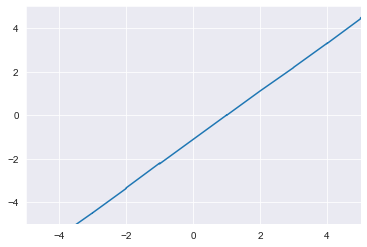

In [34]:
import matplotlib.pyplot as plt
kerr_chop = kerr_df.query('x_angle<2 and x_angle > 0')
plt.plot(kerr_chop.y_angle,kerr_chop.theta)
plt.xlim(-5,5)
plt.ylim(-5,5)

In [25]:
print(kerr_df.head())

   frame    x_angle    y_angle         r  theta        phi
0      0 -60.000002 -60.000002  2.779781    NaN -23.126258
1      1 -59.000001 -60.000002  2.826818    NaN -22.928724
2      2 -57.999999 -60.000002  2.874537    NaN -22.528621
3      3 -57.000002 -60.000002  2.863133    NaN -22.360154
4      4 -56.000000 -60.000002  2.895734    NaN -22.169018


In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import linregress

def assess_reprojection_accuracy(df, ecc_bin_size=10):
    # Drop NaNs
    df = df.dropna(subset=["phi", "theta"])

    # Errors
    df["err_phi"] = df["phi"] - df["x_angle"]
    df["err_theta"] = df["theta"] - df["y_angle"]
    df["err_total"] = np.sqrt(df["err_phi"]**2 + df["err_theta"]**2)
    df["eccentricity"] = np.sqrt(df["x_angle"]**2 + df["y_angle"]**2)

    # Metrics
    rmse_phi = np.sqrt(mean_squared_error(df["x_angle"], df["phi"]))
    rmse_theta = np.sqrt(mean_squared_error(df["y_angle"], df["theta"]))
    mae_phi = mean_absolute_error(df["x_angle"], df["phi"])
    mae_theta = mean_absolute_error(df["y_angle"], df["theta"])

    slope_phi, intercept_phi, r_phi, _, _ = linregress(df["x_angle"], df["phi"])
    slope_theta, intercept_theta, r_theta, _, _ = linregress(df["y_angle"], df["theta"])

    print(f"Phi:   RMSE={rmse_phi:.3f}, MAE={mae_phi:.3f}, slope={slope_phi:.3f}, R²={r_phi**2:.3f}")
    print(f"Theta: RMSE={rmse_theta:.3f}, MAE={mae_theta:.3f}, slope={slope_theta:.3f}, R²={r_theta**2:.3f}")
    print(f"Overall mean angular error: {df['err_total'].mean():.3f}°")

    # Scatter with identity line
    fig, axes = plt.subplots(1,2, figsize=(10,5))
    axes[0].scatter(df["x_angle"], df["phi"], alpha=0.5, s=10)
    axes[0].plot(df["x_angle"], df["x_angle"], 'r--')
    axes[0].set_xlabel("Ground truth x_angle")
    axes[0].set_ylabel("Predicted phi")
    axes[0].set_title("Phi vs x_angle")

    axes[1].scatter(df["y_angle"], df["theta"], alpha=0.5, s=10)
    axes[1].plot(df["y_angle"], df["y_angle"], 'r--')
    axes[1].set_xlabel("Ground truth y_angle")
    axes[1].set_ylabel("Predicted theta")
    axes[1].set_title("Theta vs y_angle")
    plt.show()

    # Error vs eccentricity
    bins = np.arange(0, df["eccentricity"].max() + ecc_bin_size, ecc_bin_size)
    grouped = df.groupby(pd.cut(df["eccentricity"], bins))
    ecc_means = grouped["err_total"].mean()
    ecc_centers = [interval.mid for interval in ecc_means.index.categories]

    plt.figure(figsize=(6,4))
    plt.plot(ecc_centers, ecc_means, marker="o")
    plt.xlabel("Eccentricity (deg)")
    plt.ylabel("Mean total error (deg)")
    plt.title("Error vs eccentricity")
    plt.show()

    return df


Phi:   RMSE=4.447, MAE=3.981, slope=1.065, R²=0.997
Theta: RMSE=5.309, MAE=4.028, slope=1.240, R²=0.990
Overall mean angular error: 6.139°


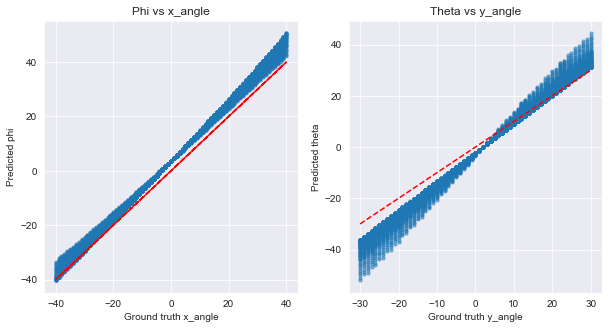

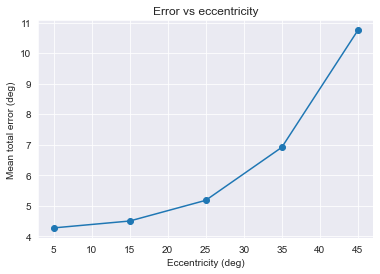

,frame,x_angle,y_angle,r,theta,phi,err_phi,err_theta,err_total,eccentricity
3651,3651,-39.000001,-29.999970,3.257610,-43.779639,-32.124843,6.875158,-13.779669,15.399580,49.203641
3652,3652,-38.000000,-29.999970,3.256901,-43.333067,-31.307372,6.692628,-13.333097,14.918537,48.414855
3653,3653,-37.000002,-29.999970,3.267895,-42.893881,-30.496383,6.503619,-12.893911,14.441260,47.634004
3654,3654,-36.000001,-29.999970,3.273768,-42.392818,-29.610131,6.389870,-12.392848,13.943210,46.861480
3655,3655,-35.000000,-29.999970,3.278880,-42.042083,-28.723082,6.276918,-12.042113,13.579844,46.097703
...,...,...,...,...,...,...,...,...,...,...
11470,11470,36.000001,29.999997,3.279098,41.228173,38.798347,2.798346,11.228175,11.571632,46.861497
11471,11471,37.000002,29.999997,3.267990,42.005015,39.786099,2.786097,12.005018,12.324074,47.634022
11472,11472,38.000003,29.999997,3.262052,42.667715,40.771308,2.771305,12.667718,12.967313,48.414875
11473,11473,39.000005,29.999997,3.260846,43.438095,41.765534,2.765529,13.438098,13.719717,49.203660


In [28]:
assess_reprojection_accuracy(kerr_df.query('x_angle<40 and x_angle>-40 and y_angle<30 and y_angle>-30'))

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import linregress

def _linregress_metrics(x, y):
    slope, intercept, r, p, se = linregress(x, y)
    return {
        "slope": slope,
        "intercept": intercept,
        "R2": r**2,
        "p": p,
        "stderr": se
    }

def _print_overall_metrics(df, label="ALL"):
    # Phi vs x_angle
    m_phi = _linregress_metrics(df["x_angle"], df["phi"])
    # Theta vs y_angle
    m_theta = _linregress_metrics(df["y_angle"], df["theta"])
    rmse_phi  = np.sqrt(mean_squared_error(df["x_angle"], df["phi"]))
    rmse_theta= np.sqrt(mean_squared_error(df["y_angle"], df["theta"]))
    mae_phi   = mean_absolute_error(df["x_angle"], df["phi"])
    mae_theta = mean_absolute_error(df["y_angle"], df["theta"])
    mean_total= df["err_total"].mean()
    med_total = df["err_total"].median()
    p90_total = np.percentile(df["err_total"], 90)

    print(f"\n=== Metrics ({label}) ===")
    print(f"Phi:   RMSE={rmse_phi:.3f}°, MAE={mae_phi:.3f}°, slope={m_phi['slope']:.3f}, "
          f"intercept={m_phi['intercept']:.3f}°, R²={m_phi['R2']:.3f}")
    print(f"Theta: RMSE={rmse_theta:.3f}°, MAE={mae_theta:.3f}°, slope={m_theta['slope']:.3f}, "
          f"intercept={m_theta['intercept']:.3f}°, R²={m_theta['R2']:.3f}")
    print(f"Total angular error (euclidean in deg): mean={mean_total:.3f}°, median={med_total:.3f}°, p90={p90_total:.3f}°")

def _plot_scatter_identity(df):
    fig, axes = plt.subplots(1,2, figsize=(10,4))
    # Phi vs x_angle
    axes[0].scatter(df["x_angle"], df["phi"], s=6, alpha=0.5)
    _lims0 = [min(df["x_angle"].min(), df["phi"].min()), max(df["x_angle"].max(), df["phi"].max())]
    axes[0].plot(_lims0, _lims0, 'r--', linewidth=1)
    axes[0].set_xlim(_lims0); axes[0].set_ylim(_lims0)
    axes[0].set_xlabel("Ground truth x_angle (deg)")
    axes[0].set_ylabel("Predicted phi (deg)")
    axes[0].set_title("Phi vs x_angle")

    # Theta vs y_angle
    axes[1].scatter(df["y_angle"], df["theta"], s=6, alpha=0.5)
    _lims1 = [min(df["y_angle"].min(), df["theta"].min()), max(df["y_angle"].max(), df["theta"].max())]
    axes[1].plot(_lims1, _lims1, 'r--', linewidth=1)
    axes[1].set_xlim(_lims1); axes[1].set_ylim(_lims1)
    axes[1].set_xlabel("Ground truth y_angle (deg)")
    axes[1].set_ylabel("Predicted theta (deg)")
    axes[1].set_title("Theta vs y_angle")
    plt.tight_layout()
    plt.show()

def _plot_error_histograms(df):
    fig, axes = plt.subplots(1,3, figsize=(12,3.5))
    axes[0].hist(df["err_phi"], bins=60, alpha=0.8)
    axes[0].set_title("err_phi (phi - x_angle)")
    axes[0].set_xlabel("deg")

    axes[1].hist(df["err_theta"], bins=60, alpha=0.8)
    axes[1].set_title("err_theta (theta - y_angle)")
    axes[1].set_xlabel("deg")

    axes[2].hist(df["err_total"], bins=60, alpha=0.8)
    axes[2].set_title("total error = sqrt(err_phi^2 + err_theta^2)")
    axes[2].set_xlabel("deg")
    plt.tight_layout()
    plt.show()

def _error_vs_eccentricity(df, ecc_bin_size=10):
    bins = np.arange(0, df["eccentricity"].max() + ecc_bin_size, ecc_bin_size)
    binned = pd.cut(df["eccentricity"], bins, include_lowest=True)
    ecc_centers = np.array([i.mid for i in binned.cat.categories])

    agg = df.groupby(binned).agg(
        mean_total_error=("err_total", "mean"),
        p90_total_error=("err_total", lambda s: np.percentile(s, 90)),
        mean_abs_phi=("err_phi", lambda s: np.mean(np.abs(s))),
        mean_abs_theta=("err_theta", lambda s: np.mean(np.abs(s))),
        n=("err_total", "size")
    )
    plt.figure(figsize=(6,4))
    plt.plot(ecc_centers, agg["mean_total_error"].to_numpy(), marker="o", label="mean total error")
    plt.plot(ecc_centers, agg["p90_total_error"].to_numpy(), marker="x", label="p90 total error")
    plt.xlabel("Eccentricity (deg)")
    plt.ylabel("Error (deg)")
    plt.title("Error vs eccentricity")
    plt.legend()
    plt.tight_layout()
    plt.show()
    return agg, ecc_centers

def _2d_error_heatmaps(df, xbins=None, ybins=None):
    """
    Heatmaps over ground-truth space (x_angle, y_angle).
    Shows mean |err_phi|, mean |err_theta|, and mean total error.
    """
    if xbins is None:
        xbins = np.linspace(df["x_angle"].min(), df["x_angle"].max(), 41)
    if ybins is None:
        ybins = np.linspace(df["y_angle"].min(), df["y_angle"].max(), 31)

    # Bin indices
    xi = np.digitize(df["x_angle"], xbins) - 1
    yi = np.digitize(df["y_angle"], ybins) - 1

    # Prepare accumulators
    H_abs_phi   = np.full((len(ybins)-1, len(xbins)-1), np.nan)
    H_abs_theta = np.full((len(ybins)-1, len(xbins)-1), np.nan)
    H_total     = np.full((len(ybins)-1, len(xbins)-1), np.nan)

    # Compute means per cell
    for yy in range(len(ybins)-1):
        row_mask = yi == yy
        if not row_mask.any():
            continue
        for xx in range(len(xbins)-1):
            mask = row_mask & (xi == xx)
            if not mask.any():
                continue
            H_abs_phi[yy, xx]   = np.mean(np.abs(df.loc[mask, "err_phi"]))
            H_abs_theta[yy, xx] = np.mean(np.abs(df.loc[mask, "err_theta"]))
            H_total[yy, xx]     = np.mean(df.loc[mask, "err_total"])

    extent = [xbins[0], xbins[-1], ybins[0], ybins[-1]]  # [xmin, xmax, ymin, ymax]

    def _one(ax, H, title):
        im = ax.imshow(
            H, origin='lower', extent=extent, aspect='auto'
        )
        ax.set_xlabel("x_angle (deg)")
        ax.set_ylabel("y_angle (deg)")
        ax.set_title(title)
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    fig, axes = plt.subplots(1,3, figsize=(14,4))
    _one(axes[0], H_abs_phi,   "Mean |err_phi| (deg)")
    _one(axes[1], H_abs_theta, "Mean |err_theta| (deg)")
    _one(axes[2], H_total,     "Mean total error (deg)")
    plt.tight_layout()
    plt.show()

def assess_reprojection_accuracy(df, ecc_bin_size=10,
                                 heatmap_bins_xy=(41,31),
                                 rect_phi_half=20, rect_theta_half=15,
                                 also_print_rect_metrics=True):
    """
    Main entry point.
    - ecc_bin_size: deg bin for eccentricity curves
    - heatmap_bins_xy: number of bins (xbins, ybins) across x_angle and y_angle
    - rect_phi_half / rect_theta_half: rectangle half-spans around (0,0)
    """
    # Drop NaNs in predictions
    df = df.dropna(subset=["phi", "theta"]).copy()

    # Errors
    df["err_phi"]   = df["phi"]   - df["x_angle"]
    df["err_theta"] = df["theta"] - df["y_angle"]
    df["err_total"] = np.sqrt(df["err_phi"]**2 + df["err_theta"]**2)
    df["eccentricity"] = np.sqrt(df["x_angle"]**2 + df["y_angle"]**2)

    # Core views
    _print_overall_metrics(df, label="ALL")
    _plot_scatter_identity(df)
    _plot_error_histograms(df)
    ecc_table, ecc_centers = _error_vs_eccentricity(df, ecc_bin_size=ecc_bin_size)

    # 2D heatmaps
    xbins = np.linspace(df["x_angle"].min(), df["x_angle"].max(), heatmap_bins_xy[0])
    ybins = np.linspace(df["y_angle"].min(), df["y_angle"].max(), heatmap_bins_xy[1])
    _2d_error_heatmaps(df, xbins=xbins, ybins=ybins)

    # Rectangle-based metrics (exact)
    rect_mask = (df["x_angle"].between(-rect_phi_half, rect_phi_half) &
                 df["y_angle"].between(-rect_theta_half, rect_theta_half))
    if also_print_rect_metrics:
        if rect_mask.any():
            _print_overall_metrics(df.loc[rect_mask], label=f"RECT |phi|≤{rect_phi_half}°, |theta|≤{rect_theta_half}°")
        else:
            print("No samples inside requested rectangle; adjust spans or check data coverage.")

    # Eccentricity-based proxies (optional; see explanation below)
    r_inscribed  = min(rect_phi_half, rect_theta_half)          # 15 in 40x30 case
    r_corners    = np.sqrt(rect_phi_half**2 + rect_theta_half**2)  # 25 in 40x30 case
    proxy_inner  = df["eccentricity"] <= r_inscribed
    proxy_outer  = df["eccentricity"] <= r_corners  # includes points beyond rectangle along axes

    # Return a dictionary of handy artifacts
    return {
        "df": df,
        "ecc_table": ecc_table,
        "rect_mask": rect_mask,
        "r_inscribed": r_inscribed,
        "r_corners": r_corners,
        "proxy_inner_mask": proxy_inner,
        "proxy_outer_mask": proxy_outer
    }

# --- Convenience: one-shot rectangle report ---
def report_rectangle_accuracy(df_artifacts, label="RECTANGLE"):
    df = df_artifacts["df"]
    rect_mask = df_artifacts["rect_mask"]
    if not rect_mask.any():
        print(f"[{label}] No samples inside rectangle.")
        return

    sub = df.loc[rect_mask]
    _print_overall_metrics(sub, label=label)



=== Metrics (ALL) ===
Phi:   RMSE=8.229°, MAE=6.181°, slope=0.942, intercept=4.998°, R²=0.963
Theta: RMSE=13.719°, MAE=10.220°, slope=1.322, intercept=-2.974°, R²=0.965
Total angular error (euclidean in deg): mean=12.774°, median=9.813°, p90=26.582°


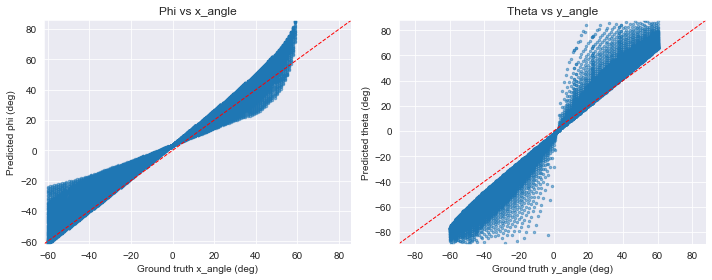

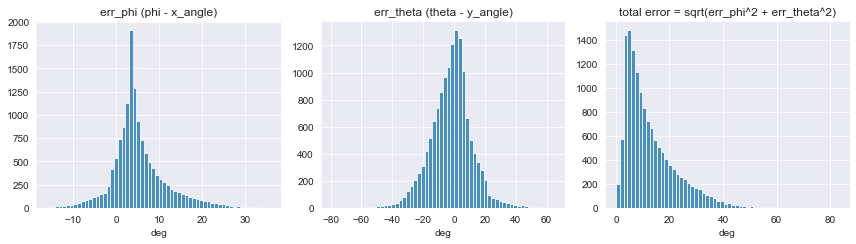

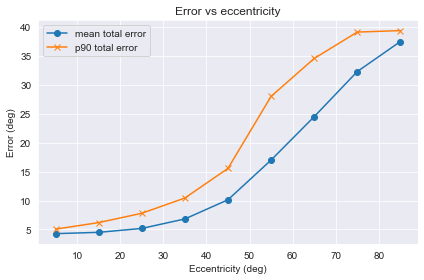

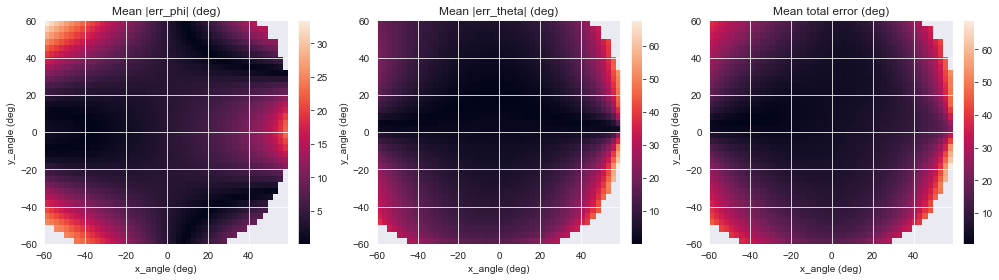


=== Metrics (RECT |phi|≤20°, |theta|≤15°) ===
Phi:   RMSE=3.876°, MAE=3.683°, slope=1.103, intercept=3.683°, R²=1.000
Theta: RMSE=2.584°, MAE=2.229°, slope=1.145, intercept=-2.263°, R²=0.999
Total angular error (euclidean in deg): mean=4.484°, median=4.491°, p90=6.168°

=== Metrics (FOV 40x30) ===
Phi:   RMSE=3.876°, MAE=3.683°, slope=1.103, intercept=3.683°, R²=1.000
Theta: RMSE=2.584°, MAE=2.229°, slope=1.145, intercept=-2.263°, R²=0.999
Total angular error (euclidean in deg): mean=4.484°, median=4.491°, p90=6.168°


In [31]:
art = assess_reprojection_accuracy(kerr_df,
                                   ecc_bin_size=10,
                                   heatmap_bins_xy=(49,37),
                                   rect_phi_half=20,  # half of 40°
                                   rect_theta_half=15)  # half of 30°

# If you want to re-print just the rectangle metrics later:
report_rectangle_accuracy(art, label="FOV 40x30")


In [32]:
import numpy as np
import matplotlib.pyplot as plt

def plot_accuracy_heatmap(
    df,
    span_x=(-20, 20),         # truncation limits for x_angle (deg)
    span_y=(-15, 15),         # truncation limits for y_angle (deg)
    metric="total",           # "total" (sqrt(err_phi^2+err_theta^2)) | "phi" | "theta"
    bins=(100, 75),           # (xbins, ybins)
    title=None,
    show_stats=True,          # annotate mean/median/p90 on the figure
    figsize=(6.8, 4.6),
    grid=False
):
    """
    Make a single heatmap of mean error within a rectangular FOV:
      - df columns required: x_angle, y_angle, phi, theta
      - metric="total": euclidean error in deg; "phi"/"theta": per-axis |error|
      - span_x/span_y: tuples (min,max) defining the heatmap window (deg)
      - bins: number of bins along x,y (higher -> smoother, slower)
    """

    required = {"x_angle", "y_angle", "phi", "theta"}
    missing = required - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing required columns: {missing}")

    # Drop NaNs on the necessary fields
    sub = df[["x_angle", "y_angle", "phi", "theta"]].dropna().copy()

    # Errors (deg)
    sub["err_phi"]   = sub["phi"]   - sub["x_angle"]
    sub["err_theta"] = sub["theta"] - sub["y_angle"]

    if metric == "total":
        val = np.sqrt(sub["err_phi"].to_numpy()**2 + sub["err_theta"].to_numpy()**2)
        metric_label = "Mean total error (deg)"
    elif metric == "phi":
        val = np.abs(sub["err_phi"].to_numpy())
        metric_label = "Mean |err_phi| (deg)"
    elif metric == "theta":
        val = np.abs(sub["err_theta"].to_numpy())
        metric_label = "Mean |err_theta| (deg)"
    else:
        raise ValueError("metric must be one of: 'total', 'phi', 'theta'")

    x = sub["x_angle"].to_numpy()
    y = sub["y_angle"].to_numpy()

    # Restrict to requested rectangular span
    xmin, xmax = float(span_x[0]), float(span_x[1])
    ymin, ymax = float(span_y[0]), float(span_y[1])
    m = (x >= xmin) & (x <= xmax) & (y >= ymin) & (y <= ymax)
    if not np.any(m):
        raise ValueError("No samples fall inside the requested span_x/span_y window.")

    x = x[m]; y = y[m]; val = val[m]

    # Build bin edges
    nx, ny = int(bins[0]), int(bins[1])
    xedges = np.linspace(xmin, xmax, nx + 1)
    yedges = np.linspace(ymin, ymax, ny + 1)

    # Digitize once
    xi = np.clip(np.digitize(x, xedges) - 1, 0, nx - 1)
    yi = np.clip(np.digitize(y, yedges) - 1, 0, ny - 1)

    # Accumulate sums and counts per cell using np.add.at (fast, vectorized)
    sums   = np.zeros((ny, nx), dtype=float)
    counts = np.zeros((ny, nx), dtype=float)
    np.add.at(sums,   (yi, xi), val)
    np.add.at(counts, (yi, xi), 1.0)

    with np.errstate(invalid="ignore", divide="ignore"):
        H = sums / counts  # mean in each occupied cell

    # Color scale: clip to 95th percentile to avoid outlier blow-outs
    finite_vals = H[np.isfinite(H)]
    if finite_vals.size == 0:
        raise ValueError("All bins are empty after filtering; try fewer bins or a wider span.")
    vmax = np.percentile(finite_vals, 95)
    vmin = 0.0

    # Plot
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(
        H,
        origin="lower",
        extent=[xmin, xmax, ymin, ymax],  # x from left->right, y bottom->top
        aspect="auto",
        vmin=vmin,
        vmax=vmax,        # perceptually uniform default cmap (matplotlib default)
        interpolation="nearest"
    )

    ax.set_xlabel("x_angle (deg)")
    ax.set_ylabel("y_angle (deg)")
    ax.set_title(title or f"Accuracy heatmap within {xmin}…{xmax}° by {ymin}…{ymax}°  |  metric: {metric}")

    # Optional grid for readability
    if grid:
        ax.grid(True, linestyle=":", linewidth=0.6, alpha=0.5)

    # Draw the FOV rectangle outline (just for emphasis)
    ax.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin], linewidth=1.0)

    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(metric_label)

    # Stats annotation (on the data inside the rectangle)
    if show_stats:
        mean_val = float(np.mean(val))
        med_val  = float(np.median(val))
        p90_val  = float(np.percentile(val, 90))
        txt = f"mean={mean_val:.2f}° | median={med_val:.2f}° | p90={p90_val:.2f}° | n={val.size}"
        ax.text(0.99, 0.01, txt, transform=ax.transAxes,
                ha="right", va="bottom", fontsize=9,
                bbox=dict(boxstyle="round,pad=0.25", facecolor="white", alpha=0.75, linewidth=0.0))

    plt.tight_layout()
    plt.show()


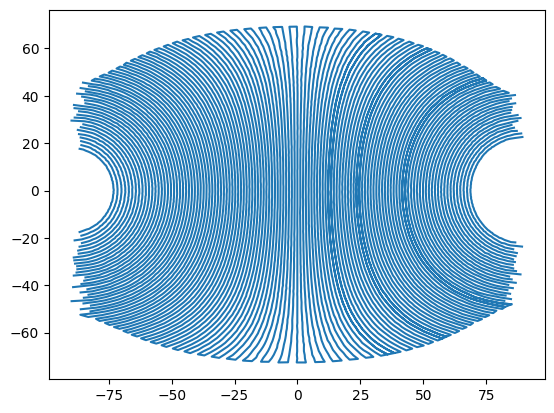

In [19]:
plt.plot(np.array(kerr_df.theta.values),np.array(kerr_df.phi.values))

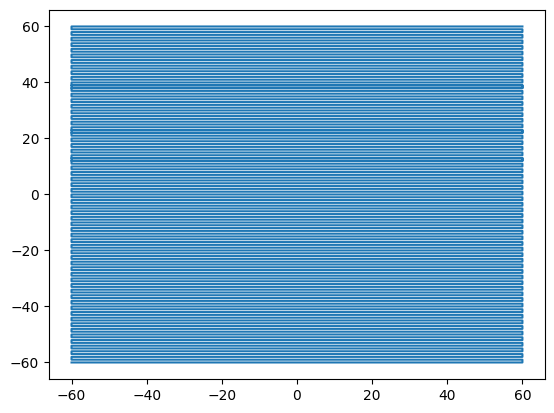

In [18]:
plt.plot(np.array(kerr_df.x_angle.values),np.array(kerr_df.y_angle.values))

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def _compute_errors(df):
    df = df.dropna(subset=["x_angle","y_angle","phi","theta"]).copy()
    df["err_phi"]   = df["phi"]   - df["x_angle"]
    df["err_theta"] = df["theta"] - df["y_angle"]
    df["err_total"] = np.sqrt(df["err_phi"]**2 + df["err_theta"]**2)
    return df

def _bin_square_xy(x, y, val, k, bins):
    # Square domain [-k, k] x [-k, k]
    if isinstance(bins, int):
        nx = ny = int(bins)
    else:
        nx, ny = map(int, bins)
    xedges = np.linspace(-k, k, nx+1)
    yedges = np.linspace(-k, k, ny+1)
    xi = np.clip(np.digitize(x, xedges) - 1, 0, nx-1)
    yi = np.clip(np.digitize(y, yedges) - 1, 0, ny-1)
    counts = np.zeros((ny, nx), float)
    sums   = np.zeros((ny, nx), float)
    np.add.at(counts, (yi, xi), 1.0)
    if val is not None:
        np.add.at(sums, (yi, xi), val)
        with np.errstate(invalid="ignore", divide="ignore"):
            H = sums / counts
    else:
        H = None

    # Circular mask on cell centers
    xc = (xedges[:-1] + xedges[1:]) / 2.0
    yc = (yedges[:-1] + yedges[1:]) / 2.0
    XX, YY = np.meshgrid(xc, yc)
    circle_mask = (XX**2 + YY**2) <= (k**2)
    return xedges, yedges, counts, H, circle_mask

def _asymmetry_scores(A, mask):
    """Normalized L1 asymmetry versus x-mirror, y-mirror, 180° rotation (lower is better)."""
    M = mask & np.isfinite(A)
    if not np.any(M):
        return {"x_mirror": np.nan, "y_mirror": np.nan, "rot180": np.nan}
    Ax = np.flip(A, axis=1)
    Ay = np.flip(A, axis=0)
    Arot = np.flip(Ay, axis=1)

    denom = np.sum(np.abs(A[M])) + 1e-12
    ax = np.sum(np.abs((A - Ax)[M])) / denom
    ay = np.sum(np.abs((A - Ay)[M])) / denom
    arot = np.sum(np.abs((A - Arot)[M])) / denom
    return {"x_mirror": ax, "y_mirror": ay, "rot180": arot}

def symmetry_diagnostics(
    df,
    k=None,                  # circular radius on GT plane; if None, use max radius of data
    bins=160,                # tiles per axis (int or (nx,ny))
    metric="total",          # "total" | "phi" | "theta"
    ang_bins=72,             # bins for angle-wise error curve
    figsize_scatter=(10,4),
    figsize_residuals=(12,4),
    figsize_polar=(6,3.5)
):
    """
    Verify symmetry of ground-truth sampling and model error.
    Produces 4 figures and prints asymmetry scores.
    """
    df = _compute_errors(df)

    # Choose error value to analyze
    if metric == "total":
        err_vals = df["err_total"].to_numpy()
        metric_label = "total error (deg)"
    elif metric == "phi":
        err_vals = np.abs(df["err_phi"].to_numpy())
        metric_label = "|err_phi| (deg)"
    elif metric == "theta":
        err_vals = np.abs(df["err_theta"].to_numpy())
        metric_label = "|err_theta| (deg)"
    else:
        raise ValueError("metric must be one of: 'total', 'phi', 'theta'")

    x = df["x_angle"].to_numpy()
    y = df["y_angle"].to_numpy()
    r = np.sqrt(x**2 + y**2)
    if k is None:
        k = float(np.nanmax(r))
    else:
        k = float(k)

    # Restrict to circle
    m = r <= k
    x, y, err_vals = x[m], y[m], err_vals[m]
    if x.size == 0:
        raise ValueError("No samples within the requested radius k.")

    # --- FIG 1: scatters (GT and predictions) ---
    fig, axes = plt.subplots(1,2, figsize=figsize_scatter)
    # GT scatter
    axes[0].scatter(x, y, s=6, alpha=0.6)
    t = np.linspace(0, 2*np.pi, 512)
    axes[0].plot(k*np.cos(t), k*np.sin(t), lw=1.0, color='k', alpha=0.7)
    axes[0].set_aspect('equal'); axes[0].set_xlim(-k,k); axes[0].set_ylim(-k,k)
    axes[0].set_title("Ground truth points (x_angle, y_angle)")
    axes[0].set_xlabel("x_angle (deg)"); axes[0].set_ylabel("y_angle (deg)")

    # Predicted scatter (phi, theta) for the same indices
    axes[1].scatter(df.loc[m,"phi"], df.loc[m,"theta"], s=6, alpha=0.6)
    axes[1].set_aspect('equal')
    # Draw same radius for visual reference around (0,0)
    axes[1].plot(k*np.cos(t), k*np.sin(t), lw=1.0, color='k', alpha=0.3)
    axes[1].set_xlim(-k,k); axes[1].set_ylim(-k,k)
    axes[1].set_title("Predicted points (phi, theta)")
    axes[1].set_xlabel("phi (deg)"); axes[1].set_ylabel("theta (deg)")
    plt.tight_layout(); plt.show()

    # --- Bin occupancy and error on GT plane ---
    xedges, yedges, counts, H, circle_mask = _bin_square_xy(x, y, err_vals, k, bins)

    # --- FIG 2: symmetry residual maps for OCCUPANCY and ERROR ---
    def _residual_fig(A, title, cmap="coolwarm", clim=None):
        # residuals vs mirrors
        Rx = A - np.flip(A, axis=1)
        Ry = A - np.flip(A, axis=0)
        Rr = A - np.flip(np.flip(A, axis=0), axis=1)
        # mask outside circle
        Rx = np.ma.array(Rx, mask=~circle_mask)
        Ry = np.ma.array(Ry, mask=~circle_mask)
        Rr = np.ma.array(Rr, mask=~circle_mask)
        X, Y = np.meshgrid(xedges, yedges)
        fig, axes = plt.subplots(1,3, figsize=figsize_residuals)
        for ax, R, ttl in zip(axes, [Rx,Ry,Rr], ["X-mirror residual","Y-mirror residual","180° residual"]):
            pcm = ax.pcolormesh(X, Y, R, shading='flat', cmap=cmap)
            if clim: pcm.set_clim(*clim)
            ax.set_aspect('equal'); ax.set_xlim(-k,k); ax.set_ylim(-k,k)
            ax.set_title(f"{title}\n{ttl}")
            ax.set_xlabel("x_angle (deg)"); ax.set_ylabel("y_angle (deg)")
            fig.colorbar(pcm, ax=ax, fraction=0.046, pad=0.04)
        plt.tight_layout(); plt.show()

    # Occupancy residuals (log for dynamic range)
    occ = counts.copy()
    occ[occ==0] = np.nan
    occ_log = np.log10(occ)  # preserves ratios; NaN for empty
    _residual_fig(occ_log, "Occupancy (log10(count)) residuals")

    # Error residuals (mean error per cell)
    _residual_fig(H, f"Error residuals ({metric_label})")

    # --- Symmetry scores ---
    occ_scores = _asymmetry_scores(occ_log, circle_mask)
    err_scores = _asymmetry_scores(H, circle_mask)
    print("\nNormalized asymmetry (lower=better, 0 = perfect symmetry):")
    print(f"  Occupancy  ->  x-mirror: {occ_scores['x_mirror']:.3f},  y-mirror: {occ_scores['y_mirror']:.3f},  rot180: {occ_scores['rot180']:.3f}")
    print(f"  {metric_label:<12} ->  x-mirror: {err_scores['x_mirror']:.3f},  y-mirror: {err_scores['y_mirror']:.3f},  rot180: {err_scores['rot180']:.3f}")

    # --- FIG 3: error vs polar angle (angular bias) ---
    ang = np.mod(np.degrees(np.arctan2(y, x)), 360.0)
    bins_ang = np.linspace(0, 360, ang_bins+1)
    which = np.clip(np.digitize(ang, bins_ang) - 1, 0, ang_bins-1)
    sums = np.zeros(ang_bins); cnts = np.zeros(ang_bins)
    np.add.at(sums, which, err_vals); np.add.at(cnts, which, 1)
    with np.errstate(invalid="ignore", divide="ignore"):
        mean_err_by_angle = sums / cnts

    centers = 0.5*(bins_ang[:-1] + bins_ang[1:])
    plt.figure(figsize=figsize_polar)
    plt.plot(centers, mean_err_by_angle, marker='o', ms=3)
    plt.xlim(0,360); plt.xticks(np.arange(0,361,45))
    plt.xlabel("Polar angle of ground truth (deg)")
    plt.ylabel(f"Mean {metric_label}")
    plt.title("Angular bias (flat line ≈ radial symmetry)")
    plt.tight_layout(); plt.show()

    return {
        "k": k,
        "xedges": xedges,
        "yedges": yedges,
        "counts": counts,
        "error_map": H,
        "circle_mask": circle_mask,
        "asymmetry": {"occupancy": occ_scores, "error": err_scores},
        "angular_profile_deg": (centers, mean_err_by_angle)
    }


In [9]:
plt.figure(figsize=(5,5))
plt.scatter(kerr_df.x_angle, kerr_df.y_angle, s=4, alpha=0.5)
plt.gca().set_aspect('equal'); plt.title('Ground truth grid')

NameError: name 'plt' is not defined

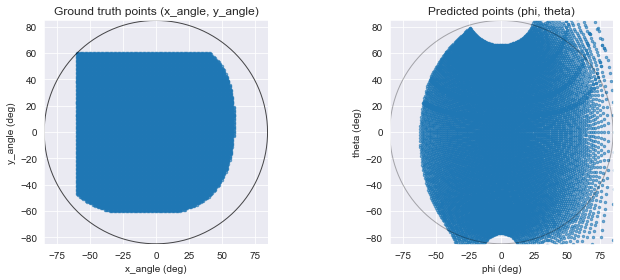

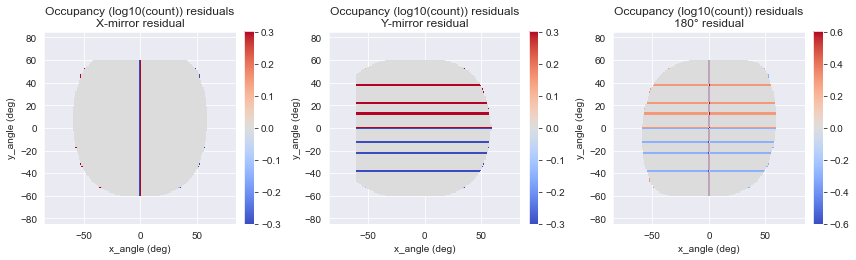

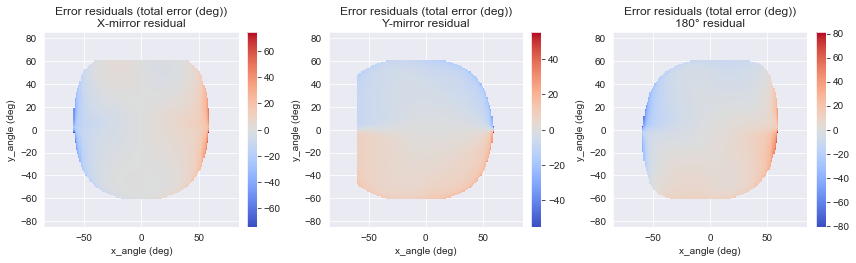


Normalized asymmetry (lower=better, 0 = perfect symmetry):
  Occupancy  ->  x-mirror: nan,  y-mirror: nan,  rot180: nan
  total error (deg) ->  x-mirror: nan,  y-mirror: nan,  rot180: nan


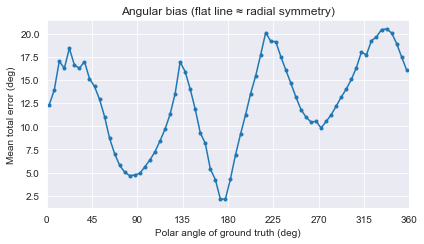

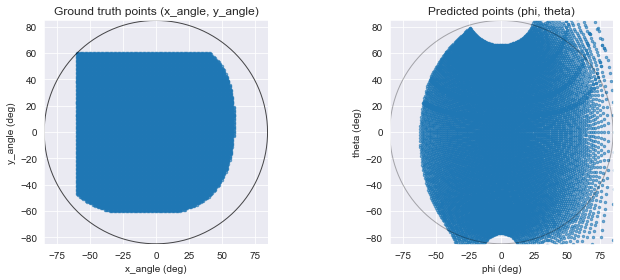

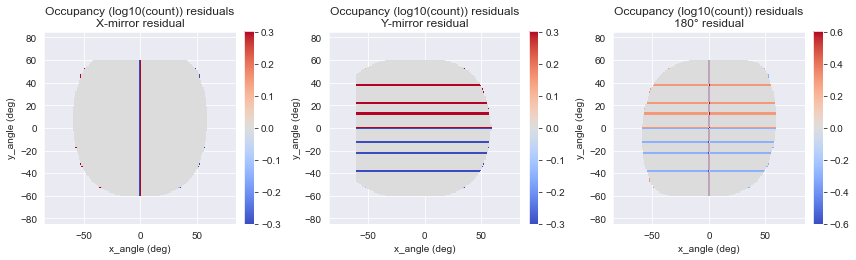

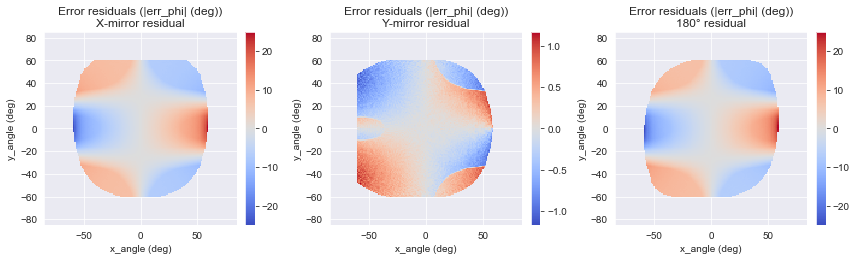


Normalized asymmetry (lower=better, 0 = perfect symmetry):
  Occupancy  ->  x-mirror: nan,  y-mirror: nan,  rot180: nan
  |err_phi| (deg) ->  x-mirror: nan,  y-mirror: nan,  rot180: nan


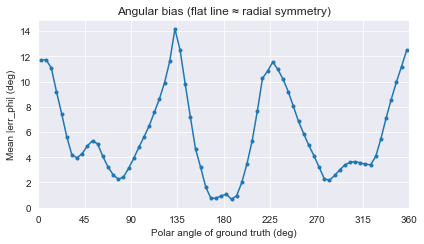

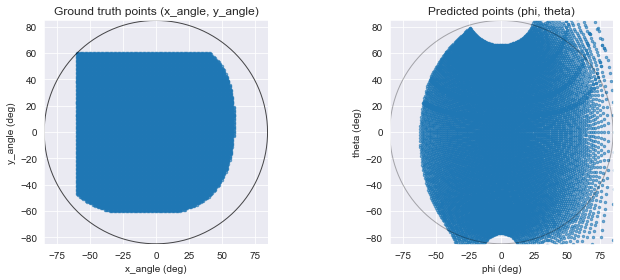

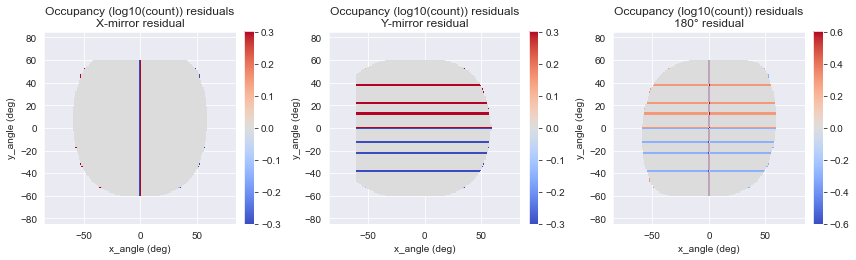

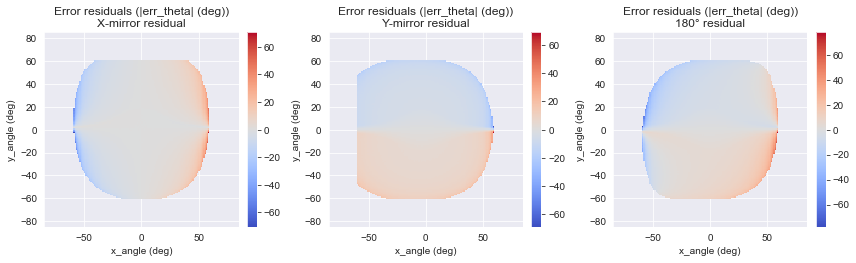


Normalized asymmetry (lower=better, 0 = perfect symmetry):
  Occupancy  ->  x-mirror: nan,  y-mirror: nan,  rot180: nan
  |err_theta| (deg) ->  x-mirror: nan,  y-mirror: nan,  rot180: nan


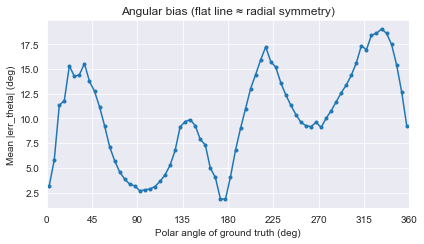

In [57]:

# Basic run with a 20° radius (adjust k to your GT coverage)
art = symmetry_diagnostics(kerr_df, k=None, bins=160, metric="total")

# If you want to check phi-only or theta-only error symmetry:
_ = symmetry_diagnostics(kerr_df, k=None, bins=160, metric="phi")
_ = symmetry_diagnostics(kerr_df, k=None, bins=160, metric="theta")


In [59]:
kerr_df

,frame,x_angle,y_angle,r,theta,phi
0,0,-60.000002,-60.000002,2.779781,NaN,-23.126258
1,1,-59.000001,-60.000002,2.826818,NaN,-22.928724
2,2,-57.999999,-60.000002,2.874537,NaN,-22.528621
3,3,-57.000002,-60.000002,2.863133,NaN,-22.360154
4,4,-56.000000,-60.000002,2.895734,NaN,-22.169018
...,...,...,...,...,...,...
15362,15362,56.000011,60.000029,2.914355,NaN,30.979256
15363,15363,57.000005,60.000029,2.899706,NaN,31.340358
15364,15364,57.999999,60.000029,2.897599,NaN,31.390600
15365,15365,58.999994,60.000029,2.831763,NaN,31.904281


In [73]:
import numpy as np
import matplotlib.pyplot as plt

def plot_gt_eccentricity(df,
                         use_df_r=False,     # color by df['r'] if present; axes still based on XY span
                         k=None,             # optional fixed outer radius for the overlay circle (deg)
                         s=6, alpha=0.7, cmap='viridis',
                         figsize=(6.2, 6.2), title='Ground truth eccentricity (r)'):
    required = {"x_angle","y_angle"}
    missing = required - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing required columns: {missing}")

    x = df["x_angle"].to_numpy()
    y = df["y_angle"].to_numpy()
    r_xy = np.hypot(x, y)                  # true angular eccentricity for geometry/axes

    # choose what to COLOR by
    if use_df_r and "r" in df.columns:
        r_color = df["ratio2"].to_numpy()
        color_label = "ratio2 (from DataFrame)"
    else:
        r_color = r_xy
        color_label = "eccentricity r = sqrt(x^2+y^2) (deg)"

    # drop NaNs consistently
    m = np.isfinite(x) & np.isfinite(y) & np.isfinite(r_xy) & np.isfinite(r_color)
    x, y, r_xy, r_color = x[m], y[m], r_xy[m], r_color[m]

    # axes/circle radius is based on XY coverage, not on r_color
    R = float(np.nanmax(r_xy)) if k is None else float(k)

    # robust color scaling for readability (based on the chosen color quantity)
    cmin = np.nanpercentile(r_color, 1)
    cmax = np.nanpercentile(r_color, 99)

    fig, ax = plt.subplots(figsize=figsize)
    sc = ax.scatter(x, y, c=r_color, s=s, alpha=alpha, cmap=cmap, vmin=cmin, vmax=cmax, linewidths=0)

    ax.set_aspect('equal', adjustable='box')
    pad = 0.05 * (2*R)
    ax.set_xlim(-R - pad, R + pad)
    ax.set_ylim(-R - pad, R + pad)
    ax.set_xlabel("x_angle (deg)")
    ax.set_ylabel("y_angle (deg)")
    ax.set_title(title)

    # overlay outer circle at radius R
    t = np.linspace(0, 2*np.pi, 512)
    ax.plot(R*np.cos(t), R*np.sin(t), color='k', lw=1.0, alpha=0.6)

    cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(color_label)

    # stats box for both quantities
    txt = (f"n={r_xy.size} | r_xy: min={np.nanmin(r_xy):.1f}°, med={np.nanmedian(r_xy):.1f}°, max={np.nanmax(r_xy):.1f}°"
           f"\ncolor range: {np.nanmin(r_color):.2f} … {np.nanmax(r_color):.2f}")
    ax.text(0.99, 0.01, txt, transform=ax.transAxes, ha="right", va="bottom",
            fontsize=9, bbox=dict(boxstyle="round,pad=0.25", facecolor="white", alpha=0.75, linewidth=0))

    # warn if r_color looks nothing like r_xy (common when r is not eccentricity)
    if np.nanmax(r_color) < 0.2 * R:
        ax.text(0.01, 0.99, "Note: coloring quantity ≠ angular eccentricity",
                transform=ax.transAxes, ha="left", va="top", fontsize=8,
                bbox=dict(boxstyle="round,pad=0.25", facecolor="yellow", alpha=0.6, linewidth=0))

    plt.tight_layout()
    plt.show()


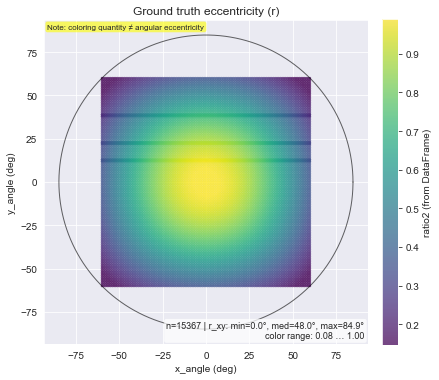

In [75]:


# If you explicitly want to color by an existing 'r' column:
plot_gt_eccentricity(kerr_df, use_df_r=True)




In [98]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_error_vs_ratio(
    df,
    metric="total",          # "total" | "phi" | "theta"
    bins=30,                 # number of ratio bins
    min_per_bin=20,          # drop sparse bins (< this many samples)
    save_path=None           # optional path to save the figure
):
    """
    Plots mean angular error vs. ellipse ratio2 (minor/major).

    Required df columns: ratio2, x_angle, y_angle, phi, theta
    metric:
      - "total": sqrt((phi-x)^2 + (theta-y)^2)  [deg]
      - "phi":   |phi - x_angle|                [deg]
      - "theta": |theta - y_angle|              [deg]
    Styling: size=(2, 1.5) inches, dpi=300, lw=1.5, labels=10pt, ticks=8pt, no grid.
    Returns the binned summary DataFrame.
    """
    req = {"ratio2","x_angle","y_angle","phi","theta"}
    missing = req - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing columns: {missing}")

    d = df[list(req)].dropna().copy()

    # errors
    d["err_phi"]   = d["phi"]   - d["x_angle"]
    d["err_theta"] = d["theta"] - d["y_angle"]
    if metric == "total":
        d["error"] = np.sqrt(d["err_phi"]**2 + d["err_theta"]**2)
        ylab = "Mean total angular error (deg)"
    elif metric == "phi":
        d["error"] = np.abs(d["err_phi"])
        ylab = "Mean |φ − x_angle| (deg)"
    elif metric == "theta":
        d["error"] = np.abs(d["err_theta"])
        ylab = "Mean |θ − y_angle| (deg)"
    else:
        raise ValueError("metric must be one of: 'total', 'phi', 'theta'")

    # clean/clip ratio to [0, 1]
    d["ratio2"] = pd.to_numeric(d["ratio2"], errors="coerce")
    d = d.dropna(subset=["ratio2"])
    d["ratio2"] = d["ratio2"].clip(lower=0.0, upper=1.0)

    # binning
    edges = np.linspace(0.0, 1.0, bins + 1)
    cats = pd.cut(d["ratio2"], edges, include_lowest=True)
    g = d.groupby(cats, observed=True).agg(
        mean_error=("error", "mean"),
        n=("error", "size"),
    ).reset_index(drop=False)

    # bin centers for plotting
    centers = 0.5 * (edges[:-1] + edges[1:])
    g["center"] = centers[:len(g)]

    # drop sparse
    g = g[g["n"] >= min_per_bin]

    # --- plotting (exact style specs) ---
    fig, ax = plt.subplots(figsize=(2, 1.5), dpi=300)
    ax.plot(g["center"], g["mean_error"], linewidth=1.5)

    ax.set_xlim(0, 1)
    ax.set_xlabel("Minor/Major axis ratio", fontsize=10)
    ax.set_ylabel(ylab, fontsize=10)
    ax.tick_params(axis="both", labelsize=8, width=0.8, length=3)
    ax.grid(False)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, bbox_inches="tight", dpi=300)

    return g


In [99]:
kerr_df.columns

Index(['frame', 'x_angle', 'y_angle', 'ratio2', 'ratio1', 'r', 'theta', 'phi'], dtype='object')

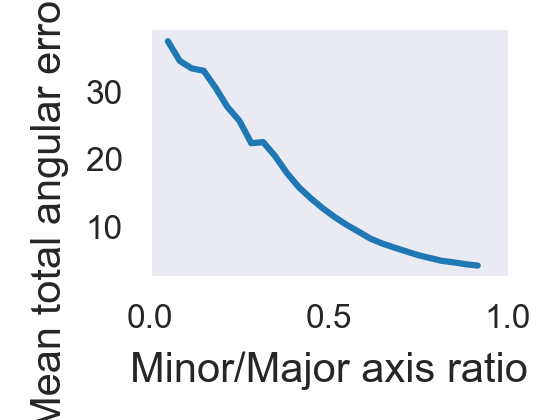

In [100]:
# Total angular error vs. ratio2
summary = plot_error_vs_ratio(kerr_df, metric="total", bins=30, min_per_bin=20)

# If you want φ-only or θ-only:
# summary = plot_error_vs_ratio(kerr_df, metric="phi")
# summary = plot_error_vs_ratio(kerr_df, metric="theta")


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

def plot_error_vs_ratio_with_span_clean(
    df,
    k=40,                     # span (deg) -> ring radius R=k/2
    metric="total",           # "total" | "phi" | "theta"
    bins=30,                  # ratio bins over [0,1]
    min_per_bin=20,           # drop sparse bins
    ring_halfwidth_deg=0.5,   # tolerance around R for forming the ring
    figsize=(3.2, 2.2),       # a bit larger than 2x1.5 for legible ticks
    dpi=300,
    save_path=None
):
    """
    Mean angular error vs. ellipse ratio (minor/major), x-axis reversed (1→0).
    Uses a DATA-DRIVEN mapping from span k to a ratio threshold:
      - R = k/2 (deg)
      - gather points with |sqrt(x^2+y^2) - R| <= ring_halfwidth_deg
      - ratio_cut = mean(ratio2) on that ring  → draw vertical line there
    Also computes true within-span mean error (r_xy<=R) and ratio-proxy mean (ratio2>=ratio_cut).

    Prints a concise report and returns all stats.
    """
    req = {"ratio2","x_angle","y_angle","phi","theta"}
    missing = req - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing columns: {missing}")

    d = df[list(req)].copy()
    d = d.dropna(subset=["ratio2","x_angle","y_angle","phi","theta"])

    # --- errors ---
    d["err_phi"]   = d["phi"]   - d["x_angle"]
    d["err_theta"] = d["theta"] - d["y_angle"]
    if metric == "total":
        d["error"] = np.sqrt(d["err_phi"]**2 + d["err_theta"]**2)
        ylab = "Mean total angular error (deg)"
    elif metric == "phi":
        d["error"] = np.abs(d["err_phi"])
        ylab = "Mean |φ − x_angle| (deg)"
    elif metric == "theta":
        d["error"] = np.abs(d["err_theta"])
        ylab = "Mean |θ − y_angle| (deg)"
    else:
        raise ValueError("metric must be one of: 'total', 'phi', 'theta'")

    # --- ratio & eccentricity ---
    d["ratio2"] = pd.to_numeric(d["ratio2"], errors="coerce").clip(0.0, 1.0)
    d = d.dropna(subset=["ratio2"])
    d["r_xy"] = np.hypot(d["x_angle"], d["y_angle"])

    # --- bin mean error vs ratio2 (for the curve) ---
    edges = np.linspace(0.0, 1.0, bins + 1)
    cats  = pd.cut(d["ratio2"], edges, include_lowest=True)
    g = d.groupby(cats, observed=True).agg(
        mean_error=("error","mean"),
        n=("error","size")
    ).reset_index(drop=False)

    centers = 0.5 * (edges[:-1] + edges[1:])
    g["center"] = centers[:len(g)]
    g = g[g["n"] >= min_per_bin]

    # --- data-driven ratio cutoff from span k ---
    R = float(k) / 2.0
    ring_mask = np.abs(d["r_xy"] - R) <= float(ring_halfwidth_deg)
    if not ring_mask.any():
        raise ValueError(
            f"No samples on ring r≈{R:.2f}° (±{ring_halfwidth_deg}°). "
            "Increase ring_halfwidth_deg or choose k within coverage."
        )
    ratio_ring_vals = d.loc[ring_mask, "ratio2"].to_numpy()
    ratio_cut = float(np.mean(ratio_ring_vals))
    ratio_q25, ratio_q75 = np.percentile(ratio_ring_vals, [25, 75])
    n_ring = int(ring_mask.sum())

    # --- truth: within-span (radial) and proxy (ratio) means ---
    in_span = d["r_xy"] <= R
    mean_span = float(d.loc[in_span, "error"].mean()) if in_span.any() else np.nan
    med_span  = float(d.loc[in_span, "error"].median()) if in_span.any() else np.nan
    p90_span  = float(np.percentile(d.loc[in_span, "error"], 90)) if in_span.any() else np.nan
    n_span    = int(in_span.sum())

    proxy = d["ratio2"] >= ratio_cut
    mean_proxy = float(d.loc[proxy, "error"].mean()) if proxy.any() else np.nan
    med_proxy  = float(d.loc[proxy, "error"].median()) if proxy.any() else np.nan
    p90_proxy  = float(np.percentile(d.loc[proxy, "error"], 90)) if proxy.any() else np.nan
    n_proxy    = int(proxy.sum())

    # --- plot (larger, clean, with crisp tick markers) ---
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.plot(g["center"], g["mean_error"], linewidth=1.5)
    ax.set_xlim(1, 0)  # flipped
    ax.set_xlabel("Minor/Major axis ratio", fontsize=10)
    ax.set_ylabel(ylab, fontsize=10)

    ax.tick_params(axis="both", labelsize=8, width=0.9, length=4, direction="out")
    ax.minorticks_on()
    ax.tick_params(axis="both", which="minor", width=0.7, length=2, direction="out")
    ax.xaxis.set_major_locator(MaxNLocator(5))
    ax.yaxis.set_major_locator(MaxNLocator(5))
    ax.grid(False)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # vertical line at the data-driven ratio cutoff and a faint IQR band
    ax.axvline(ratio_cut, linestyle="--", linewidth=1.0)
    ax.axvspan(ratio_q75, ratio_q25, alpha=0.10)

    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, bbox_inches="tight", dpi=dpi)

    # --- concise report (outside the figure) ---
    print(
        f"[k={k:g}°, R={R:.2f}°, ring ±{ring_halfwidth_deg}°]  "
        f"ratio_cut (mean on ring) = {ratio_cut:.4f}  "
        f"[IQR {ratio_q25:.4f}–{ratio_q75:.4f}; n_ring={n_ring}]"
    )
    print(
        f"Within-span (r≤R): mean={mean_span:.3f}°, median={med_span:.3f}°, "
        f"p90={p90_span:.3f}°, n={n_span}"
    )
    print(
        f"Ratio-proxy (ratio2≥{ratio_cut:.4f}): mean={mean_proxy:.3f}°, "
        f"median={med_proxy:.3f}°, p90={p90_proxy:.3f}°, n={n_proxy}"
    )

    return {
        "summary": g.reset_index(drop=True),
        "R_deg": R,
        "ratio_cut": {"mean": ratio_cut, "q25": float(ratio_q25), "q75": float(ratio_q75), "n": n_ring},
        "within_span": {"mean": mean_span, "median": med_span, "p90": p90_span, "n": n_span},
        "ratio_proxy": {"mean": mean_proxy, "median": med_proxy, "p90": p90_proxy, "n": n_proxy},
    }


[k=70°, R=35.00°, ring ±0.5°]  ratio_cut (mean on ring) = 0.7608  [IQR 0.7566–0.7645; n_ring=236]
Within-span (r≤R): mean=3.242°, median=3.103°, p90=5.510°, n=4088
Ratio-proxy (ratio2≥0.7608): mean=3.245°, median=3.108°, p90=5.510°, n=4092


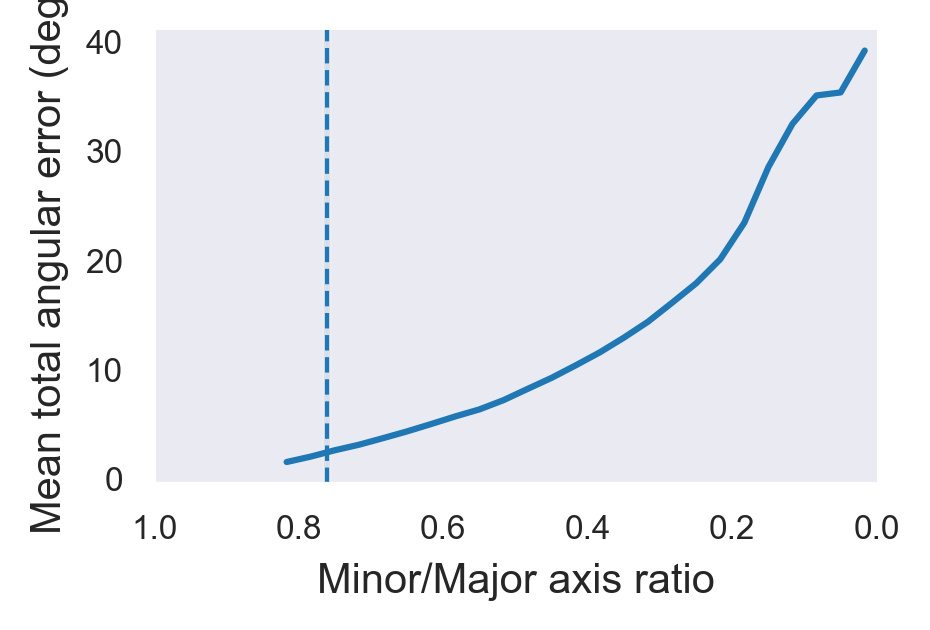

In [11]:
# Flip x-axis (1→0) with cosine-mapped cutoff at k=20°
out = plot_error_vs_ratio_with_span_clean(kerr_df, metric="total", bins=30, min_per_bin=20, k=70)

# Without a span line:
# out = plot_error_vs_ratio_flipped(kerr_df, metric="phi", k=None)


In [125]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

def plot_error_vs_ratio_with_span_dualx(
    df,
    k=40,                      # span in deg -> ring radius R = k/2
    metric="total",            # "total" | "phi" | "theta"
    bins=30,                   # for plotting the curve (ratio bins)
    min_per_bin=20,            # drop sparse plot bins
    ring_halfwidth_deg=0.5,    # thickness of the ring around R for the cutoff
    mapping_bins=200,          # resolution of the ratio→eccentricity mapping
    min_count_map_bin=1,       # require at least this many samples to accept a map bin
    figsize=(3.6, 2.4),
    dpi=300,
    tick_positions=None,       # e.g., np.linspace(1,0,6); if None, auto
    print_report=True,
    save_path=None
):
    """
    Mean angular error vs. ellipse axis ratio (minor/major). X-axis runs 1→0.
    A second (top) x-axis shows, at each ratio tick, the dataset-driven representative
    eccentricity r_xy (deg), computed as the median r_xy for samples near that ratio.

    Data-driven span mapping:
      R = k/2; ring = {|sqrt(x^2+y^2)-R| <= ring_halfwidth_deg};
      ratio_cut = mean(ratio2 on ring) -> vertical line at ratio_cut.
    """
    req = {"ratio2","x_angle","y_angle","phi","theta"}
    missing = req - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing columns: {missing}")

    d = df[list(req)].copy().dropna(subset=["ratio2","x_angle","y_angle","phi","theta"])

    # --- errors ---
    d["err_phi"]   = d["phi"]   - d["x_angle"]
    d["err_theta"] = d["theta"] - d["y_angle"]
    if metric == "total":
        d["error"] = np.sqrt(d["err_phi"]**2 + d["err_theta"]**2)
        ylab = "Mean total angular error (deg)"
    elif metric == "phi":
        d["error"] = np.abs(d["err_phi"])
        ylab = "Mean |φ − x_angle| (deg)"
    elif metric == "theta":
        d["error"] = np.abs(d["err_theta"])
        ylab = "Mean |θ − y_angle| (deg)"
    else:
        raise ValueError("metric must be 'total', 'phi', or 'theta'")

    # --- ratio & eccentricity ---
    d["ratio2"] = pd.to_numeric(d["ratio2"], errors="coerce").clip(0.0, 1.0)
    d = d.dropna(subset=["ratio2"])
    d["r_xy"] = np.hypot(d["x_angle"], d["y_angle"])

    # --- curve: mean error vs ratio2 (with sparse-bin filtering) ---
    edges = np.linspace(0.0, 1.0, bins + 1)
    cats  = pd.cut(d["ratio2"], edges, include_lowest=True)
    g = d.groupby(cats, observed=False).agg(
        mean_error=("error","mean"),
        n=("error","size")
    )
    centers_curve = np.array([iv.mid for iv in cats.cat.categories])
    g = g.assign(center=centers_curve).reset_index(drop=True)
    g = g[g["n"] >= min_per_bin].reset_index(drop=True)

    # --- span→ratio cutoff from the ring at R = k/2 ---
    R = float(k)/2.0
    ring_mask = np.abs(d["r_xy"] - R) <= float(ring_halfwidth_deg)
    if not ring_mask.any():
        raise ValueError(
            f"No samples on ring r≈{R:.2f}° (±{ring_halfwidth_deg}°). "
            "Increase ring_halfwidth_deg or choose k within coverage."
        )
    ratio_cut = float(d.loc[ring_mask, "ratio2"].mean())

    # --- dataset-driven ratio→r mapping for top x-axis ---
    map_edges = np.linspace(0.0, 1.0, mapping_bins + 1)
    map_cats  = pd.cut(d["ratio2"], map_edges, include_lowest=True)
    # Group with observed=False to keep all categories; then reindex is not needed.
    map_df = d.groupby(map_cats, observed=False).agg(
        r_med=("r_xy","median"),
        n=("r_xy","size")
    )
    centers_map = np.array([iv.mid for iv in map_cats.cat.categories])
    counts_map  = map_df["n"].fillna(0).to_numpy().astype(int)
    r_med_map   = map_df["r_med"].to_numpy()

    # Keep only bins with enough data for mapping
    valid = counts_map >= int(min_count_map_bin)
    centers_valid = centers_map[valid]
    r_med_valid   = r_med_map[valid]
    if centers_valid.size < 2:
        raise ValueError("Insufficient data to build ratio→eccentricity mapping (need ≥2 populated bins).")

    # Tick positions (on the ratio axis, which will be flipped later)
    if tick_positions is None:
        tick_positions = np.linspace(1.0, 0.0, 6)
    tick_positions = np.asarray(tick_positions, dtype=float)

    # Interpolate representative r for each ratio tick (clamped to data range)
    r_ticks = np.interp(tick_positions, centers_valid, r_med_valid,
                        left=r_med_valid[0], right=r_med_valid[-1])

    # --- plot ---
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.plot(g["center"], g["mean_error"], linewidth=1.5)
    ax.set_xlim(1, 0)  # flipped
    ax.set_xlabel("Minor/Major axis ratio", fontsize=10)
    ax.set_ylabel(ylab, fontsize=10)

    # bottom axis: show ratio with bracketed r label
    ratio_labels = [f"{t:0.2f} [{rt:.0f}°]" for t, rt in zip(tick_positions, r_ticks)]
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(ratio_labels, fontsize=8)

    ax.tick_params(axis="y", labelsize=8, width=0.9, length=4, direction="out")
    ax.minorticks_on()
    ax.tick_params(axis="y", which="minor", width=0.7, length=2, direction="out")
    ax.yaxis.set_major_locator(MaxNLocator(5))
    ax.grid(False)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Data-driven span line
    ax.axvline(ratio_cut, linestyle="--", linewidth=1.0)

    # Top x-axis with degrees only
    ax_top = ax.twiny()
    ax_top.set_xlim(ax.get_xlim())  # align
    ax_top.set_xticks(tick_positions)
    ax_top.set_xticklabels([f"{rt:.0f}°" for rt in r_ticks], fontsize=8)
    ax_top.set_xlabel("Representative eccentricity (deg)", fontsize=10)
    ax_top.tick_params(axis="x", width=0.9, length=4, direction="out")

    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, bbox_inches="tight", dpi=dpi)

    # --- report (outside the figure) ---
    in_span = d["r_xy"] <= R
    mean_span = float(d.loc[in_span, "error"].mean()) if in_span.any() else np.nan
    proxy = d["ratio2"] >= ratio_cut
    mean_proxy = float(d.loc[proxy, "error"].mean()) if proxy.any() else np.nan

    if print_report:
        print(f"k={k:g}°  →  R={R:.2f}°  →  ratio_cut={ratio_cut:.4f}")
        print(f"Within-span (r≤R)   mean error: {mean_span:.3f}°   (n={int(in_span.sum())})")
        print(f"Ratio-proxy (ratio≥{ratio_cut:.4f}) mean error: {mean_proxy:.3f}°   (n={int(proxy.sum())})")

    return {
        "summary_curve": g,                  # mean error vs ratio
        "ratio_cut": ratio_cut,              # vertical line position
        "tick_positions": tick_positions,
        "tick_r_deg": r_ticks,               # top-axis labels (deg)
        "within_span_mean": mean_span,
        "ratio_proxy_mean": mean_proxy,
    }


C:\Users\MarkS3\PycharmProjects\pythonProject3\venv\lib\site-packages\matplotlib\ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)
C:\Users\MarkS3\PycharmProjects\pythonProject3\venv\lib\site-packages\matplotlib\ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


k=64°  →  R=32.00°  →  ratio_cut=0.7977
Within-span (r≤R)   mean error: 4.983°   (n=3418)
Ratio-proxy (ratio≥0.7977) mean error: 4.988°   (n=3425)


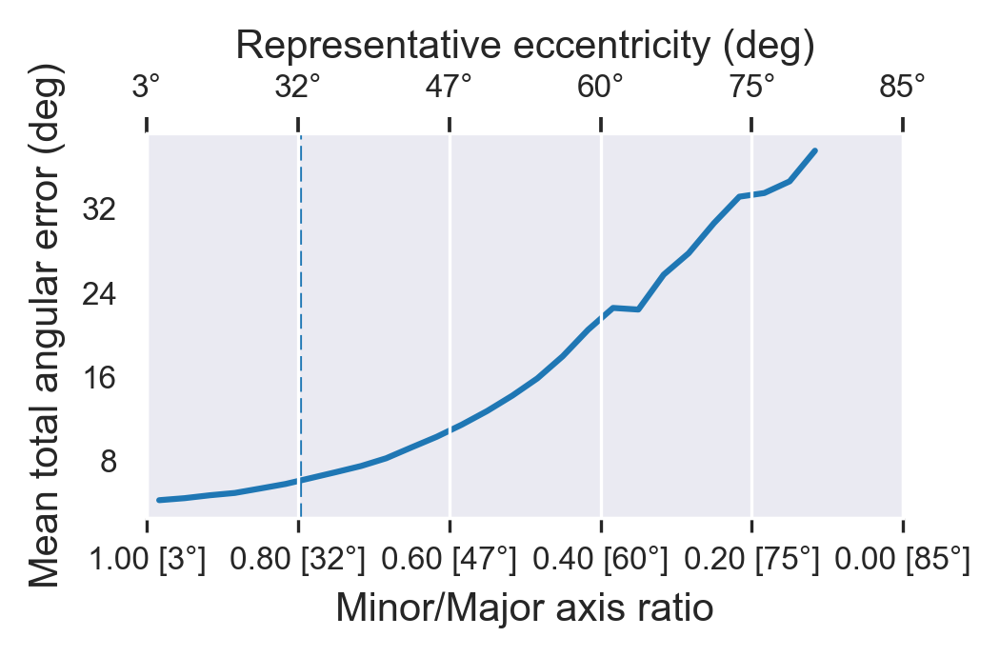

In [127]:
out = plot_error_vs_ratio_with_span_dualx(
    kerr_df,
    k=64,                  # span in deg
    metric="total",
    bins=30,
    min_per_bin=20,
    ring_halfwidth_deg=0.5,
    mapping_bins=200,
    figsize=(3.6, 2.4),
    dpi=300
)


In [128]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

def plot_error_vs_ratio_with_span_dualx_pdf(
    df,
    k=40,                      # span in deg -> ring radius R = k/2
    metric="total",            # "total" | "phi" | "theta"
    bins=30,                   # curve bins over ratio ∈ [0,1]
    min_per_bin=20,            # drop sparse curve bins
    ring_halfwidth_deg=0.5,    # thickness of ring around R for cutoff
    mapping_bins=200,          # resolution for ratio→ecc mapping
    min_count_map_bin=1,       # min samples to accept a map bin
    tick_positions=None,       # list/array of ratio tick positions (e.g., np.linspace(1,0,6))
    figsize=(3.8, 2.6),        # slightly larger for crisp ticks
    dpi=300,
    export_pdf_path=None,      # e.g., "error_vs_ratio_dualx.pdf"
    font_family="Arial"
):
    """
    Plots mean angular error vs. ratio2 with:
      • bottom x-axis = ratio (1→0)
      • top x-axis = representative eccentricity r_xy (deg), learned from data
      • dashed vertical line at ratio mapped from span k via data ring at R=k/2
    Exports to an editable PDF with Arial text if export_pdf_path is given.
    """
    # ---------- Fonts & PDF settings (editable text) ----------
    mpl.rcParams["pdf.fonttype"] = 42   # embed TrueType; keeps text editable
    mpl.rcParams["ps.fonttype"]  = 42
    mpl.rcParams["font.family"]  = "sans-serif"
    # Put requested family first; keep sensible fallbacks
    mpl.rcParams["font.sans-serif"] = [font_family, "Arial", "Liberation Sans", "DejaVu Sans"]
    # (Optional) warn if Arial isn’t available
    try:
        ff = mpl.font_manager.findfont(font_family)
        if "arial" not in ff.lower():
            print(f"Note: '{font_family}' not found; using '{ff}'. Install Arial to ensure Arial embeds in the PDF.")
    except Exception:
        pass

    # ---------- Data prep ----------
    req = {"ratio2","x_angle","y_angle","phi","theta"}
    miss = req - set(df.columns)
    if miss:
        raise ValueError(f"DataFrame missing columns: {miss}")

    d = df[list(req)].copy().dropna(subset=["ratio2","x_angle","y_angle","phi","theta"])
    d["ratio2"] = pd.to_numeric(d["ratio2"], errors="coerce").clip(0.0, 1.0)
    d = d.dropna(subset=["ratio2"])
    d["r_xy"]   = np.hypot(d["x_angle"], d["y_angle"])

    # Errors
    d["err_phi"]   = d["phi"]   - d["x_angle"]
    d["err_theta"] = d["theta"] - d["y_angle"]
    if metric == "total":
        d["error"] = np.sqrt(d["err_phi"]**2 + d["err_theta"]**2)
        ylab = "Mean total angular error (deg)"
    elif metric == "phi":
        d["error"] = np.abs(d["err_phi"])
        ylab = "Mean |φ − x_angle| (deg)"
    elif metric == "theta":
        d["error"] = np.abs(d["err_theta"])
        ylab = "Mean |θ − y_angle| (deg)"
    else:
        raise ValueError("metric must be 'total', 'phi', or 'theta'")

    # ---------- Curve: mean error vs ratio ----------
    edges = np.linspace(0.0, 1.0, bins + 1)
    cats  = pd.cut(d["ratio2"], edges, include_lowest=True)
    g = d.groupby(cats, observed=False).agg(
        mean_error=("error","mean"),
        n=("error","size")
    )
    centers_curve = np.array([iv.mid for iv in cats.cat.categories])
    g = g.assign(center=centers_curve).reset_index(drop=True)
    g = g[g["n"] >= min_per_bin].reset_index(drop=True)

    # ---------- Span→ratio cutoff using data ring at R=k/2 ----------
    R = float(k) / 2.0
    ring_mask = np.abs(d["r_xy"] - R) <= float(ring_halfwidth_deg)
    if not ring_mask.any():
        raise ValueError(
            f"No samples on ring r≈{R:.2f}° (±{ring_halfwidth_deg}°). "
            "Increase ring_halfwidth_deg or choose k within coverage."
        )
    ratio_cut = float(d.loc[ring_mask, "ratio2"].mean())

    # ---------- Dataset-driven mapping: ratio → representative r_xy ----------
    map_edges = np.linspace(0.0, 1.0, mapping_bins + 1)
    map_cats  = pd.cut(d["ratio2"], map_edges, include_lowest=True)
    map_df = d.groupby(map_cats, observed=False).agg(
        r_med=("r_xy","median"),
        n=("r_xy","size")
    )
    centers_map = np.array([iv.mid for iv in map_cats.cat.categories])
    counts_map  = map_df["n"].fillna(0).to_numpy().astype(int)
    r_med_map   = map_df["r_med"].to_numpy()

    valid = counts_map >= int(min_count_map_bin)
    centers_valid = centers_map[valid]
    r_med_valid   = r_med_map[valid]
    if centers_valid.size < 2:
        raise ValueError("Insufficient data to build ratio→eccentricity mapping (need ≥2 populated bins).")

    # Tick positions on ratio axis (still numeric; axis will be flipped later)
    if tick_positions is None:
        tick_positions = np.linspace(1.0, 0.0, 6)
    tick_positions = np.asarray(tick_positions, dtype=float)
    # Interpolate representative r for each ratio tick
    r_ticks = np.interp(tick_positions, centers_valid, r_med_valid,
                        left=r_med_valid[0], right=r_med_valid[-1])

    # ---------- Plot ----------
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    # Curve
    ax.plot(g["center"], g["mean_error"], linewidth=1.5, color="black")

    # Axes styling (ensure left & bottom visible)
    ax.set_xlim(1, 0)  # flipped ratio axis 1→0
    ax.set_xlabel("Minor/Major axis ratio", fontsize=10)
    ax.set_ylabel(ylab, fontsize=10)
    ax.tick_params(axis="both", labelsize=8, width=1.0, length=4, direction="out")
    ax.minorticks_on()
    ax.tick_params(axis="both", which="minor", width=0.8, length=2, direction="out")
    ax.yaxis.set_major_locator(MaxNLocator(5))
    # Spines: show left & bottom, hide top & right
    for spine in ("left","bottom"):
        ax.spines[spine].set_visible(True)
        ax.spines[spine].set_linewidth(1.0)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Bottom ticks: ratio only (no bracketed degrees)
    ax.set_xticks(tick_positions)
    ax.set_xticklabels([f"{t:0.2f}" for t in tick_positions], fontsize=8)

    # Span line
    ax.axvline(ratio_cut, linestyle="--", linewidth=1.0, color="black")

    # Top x-axis: degrees only
    ax_top = ax.twiny()
    ax_top.set_xlim(ax.get_xlim())  # align
    ax_top.set_xticks(tick_positions)
    ax_top.set_xticklabels([f"{rt:.0f}°" for rt in r_ticks], fontsize=8)
    ax_top.set_xlabel("Representative eccentricity (deg)", fontsize=10)
    ax_top.tick_params(axis="x", width=1.0, length=4, direction="out")
    # Make top spine visible (optional); keep right spine hidden
    ax_top.spines["top"].set_visible(True)
    ax_top.spines["top"].set_linewidth(1.0)
    ax_top.spines["right"].set_visible(False)

    plt.tight_layout()

    # ---------- Export ----------
    if export_pdf_path:
        fig.savefig(export_pdf_path, bbox_inches="tight")  # vector PDF with editable text
        print(f"Saved PDF → {export_pdf_path}")

    # ---------- Report (outside the plot) ----------
    in_span  = d["r_xy"] <= R
    mean_span = float(d.loc[in_span, "error"].mean()) if in_span.any() else np.nan
    proxy    = d["ratio2"] >= ratio_cut
    mean_proxy = float(d.loc[proxy, "error"].mean()) if proxy.any() else np.nan
    print(f"k={k:g}°  →  R={R:.2f}°  →  ratio_cut={ratio_cut:.4f}")
    print(f"Within-span (r≤R)   mean error: {mean_span:.3f}°   (n={int(in_span.sum())})")
    print(f"Ratio-proxy (ratio≥{ratio_cut:.4f}) mean error: {mean_proxy:.3f}°   (n={int(proxy.sum())})")

    return {
        "summary_curve": g,                  # mean error vs ratio
        "ratio_cut": ratio_cut,              # dashed vertical line position
        "tick_positions": tick_positions,    # ratio ticks (bottom)
        "tick_r_deg": r_ticks,               # degrees (top)
        "within_span_mean": mean_span,
        "ratio_proxy_mean": mean_proxy,
    }


C:\Users\MarkS3\PycharmProjects\pythonProject3\venv\lib\site-packages\matplotlib\ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


Saved PDF → Z:\Nimrod\Paper_Figures\2024_Personalized_headstage_eye_tracking\supplementary\kerr_accuracy_report_span70deg.pdf
k=70°  →  R=35.00°  →  ratio_cut=0.7608
Within-span (r≤R)   mean error: 5.221°   (n=4088)
Ratio-proxy (ratio≥0.7608) mean error: 5.225°   (n=4092)


C:\Users\MarkS3\PycharmProjects\pythonProject3\venv\lib\site-packages\matplotlib\ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


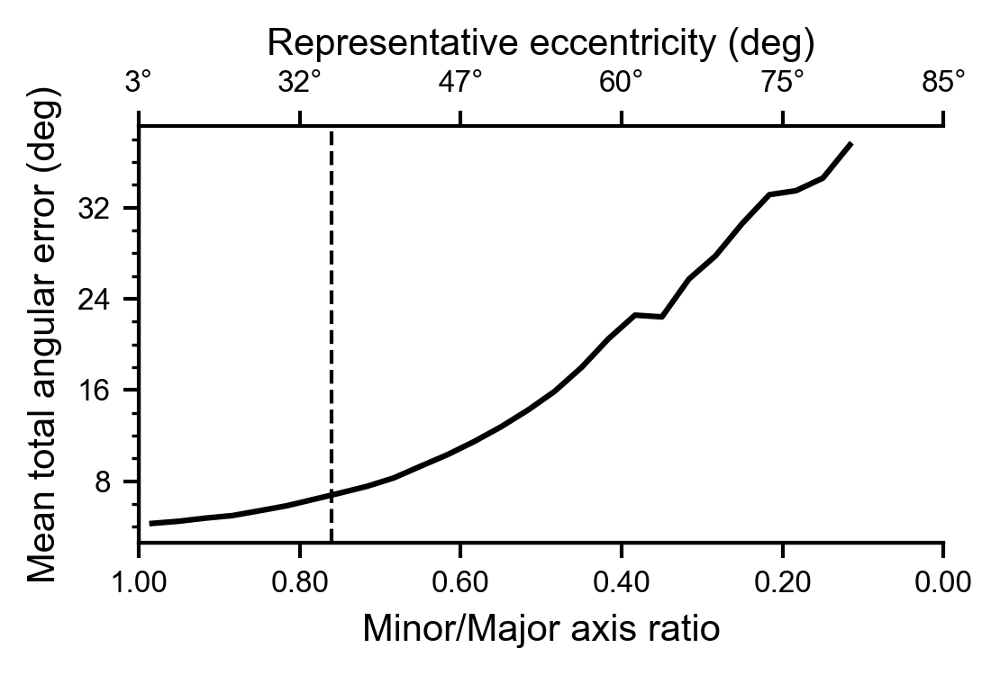

In [131]:
from matplotlib import rcParams
%matplotlib inline
plt.style.use('default')
rcParams['pdf.fonttype'] = 42  # Ensure fonts are embedded and editable
rcParams['ps.fonttype'] = 42  # Ensure compatibility with vector outputs
export_path = r'Z:\Nimrod\Paper_Figures\2024_Personalized_headstage_eye_tracking\supplementary\kerr_accuracy_report_span70deg.pdf'
out = plot_error_vs_ratio_with_span_dualx_pdf(
    kerr_df,
    k=70,
    metric="total",
    bins=30,
    min_per_bin=20,
    ring_halfwidth_deg=0.5,
    mapping_bins=200,
    figsize=(3.8, 2.6),
    dpi=300,
    export_pdf_path=export_path,   # ← editable PDF
    font_family="Arial"
)


In [12]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

def plot_error_vs_ecc_with_ratio_axis_pdf(
    df,
    k=40,                         # span (deg) -> vertical line at R=k/2 on bottom axis
    metric="total",               # "total" | "phi" | "theta"
    r_bins=30,                    # number of eccentricity bins (x points are bin centers)
    r_range=None,                 # (r_min, r_max) in deg for bottom axis, e.g. (0, 60)
    min_per_bin=20,               # drop curve bins with < this many samples
    ring_halfwidth_deg=0.5,       # for reporting ratio at the span ring (optional)
    figsize=(3.8, 2.6),
    dpi=300,
    export_pdf_path=None,
    font_family="Arial",
    y_range=None
):
    """
    Mean angular error vs eccentricity (bottom x-axis in degrees), with a top x-axis
    showing the corresponding ratio (minor/major) learned from the dataset.

    • Curve is computed by binning on eccentricity r = hypot(x_angle, y_angle).
      Each plotted point is the mean error in one r-bin, placed at that bin's CENTER.
    • Bottom x-axis extent is controlled via r_range=(r_min, r_max) in degrees.
    • The dashed vertical line is drawn at R = k/2 on the degree axis.
    • The top x-axis labels (ratio) are computed from the dataset by taking the
      median ratio in each r-bin and interpolating to the bottom tick positions.
    • PDF export uses TrueType fonts (editable text); Arial if available.
    """
    # ---------- Fonts (editable text in PDF) ----------
    from matplotlib import rcParams
    %matplotlib inline
    plt.style.use('default')
    rcParams['pdf.fonttype'] = 42  # Ensure fonts are embedded and editable
    rcParams['ps.fonttype'] = 42  # Ensure compatibility with vector outputs

    # ---------- Data prep ----------
    req = {"ratio2","x_angle","y_angle","phi","theta"}
    missing = req - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing required columns: {missing}")

    d = df[list(req)].copy().dropna(subset=list(req))
    d["ratio2"] = pd.to_numeric(d["ratio2"], errors="coerce").clip(0.0, 1.0)
    d = d.dropna(subset=["ratio2"])
    d["r_xy"] = np.hypot(d["x_angle"], d["y_angle"])

    # Errors
    d["err_phi"]   = d["phi"]   - d["x_angle"]
    d["err_theta"] = d["theta"] - d["y_angle"]
    if metric == "total":
        d["error"] = np.sqrt(d["err_phi"]**2 + d["err_theta"]**2)
        ylab = "Mean error (deg)"
    elif metric == "phi":
        d["error"] = np.abs(d["err_phi"])
        ylab = "Mean |φ − x_angle| (deg)"
    elif metric == "theta":
        d["error"] = np.abs(d["err_theta"])
        ylab = "Mean |θ − y_angle| (deg)"
    else:
        raise ValueError("metric must be 'total', 'phi', or 'theta'")

    # ---------- Eccentricity binning for the curve ----------
    # Decide axis limits in degrees
    if r_range is None:
        r_min = float(np.nanmin(d["r_xy"]))
        r_max = float(np.nanmax(d["r_xy"]))
    else:
        r_min, r_max = map(float, r_range)

    # Build r-bins across the requested extent (even if edges are empty)
    r_edges = np.linspace(r_min, r_max, int(r_bins) + 1)
    r_cats  = pd.cut(d["r_xy"], r_edges, include_lowest=True)
    centers_r = np.array([iv.mid for iv in r_cats.cat.categories])

    # Aggregate per r-bin: mean error, n, and median ratio (for top-axis mapping)
    gb = d.groupby(r_cats, observed=False).agg(
        mean_error=("error","mean"),
        n=("error","size"),
        ratio_med=("ratio2","median"),
    ).reset_index(drop=True)
    gb = gb.assign(r_center=centers_r)

    # Curve points (drop sparse bins)
    curve = gb[gb["n"] >= int(min_per_bin)].copy()

    # ---------- Span line at R = k/2 (degrees) ----------
    R = float(k) / 2.0

    # For reporting only: dataset-based ratio at that ring (use ring or fallback to interp)
    ring_mask = np.abs(d["r_xy"] - R) <= float(ring_halfwidth_deg)
    if ring_mask.any():
        ratio_at_R = float(d.loc[ring_mask, "ratio2"].mean())
    else:
        # Fallback: interpolate from r-bin medians
        valid = gb["n"].to_numpy() > 0
        ratio_at_R = float(np.interp(R, gb.loc[valid, "r_center"], gb.loc[valid, "ratio_med"]))

    # ---------- Plot ----------
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    # Draw the curve (points are at r-bin CENTERS)
    ax.plot(curve["r_center"], curve["mean_error"], linewidth=1.5, color="black")
    ax.scatter(curve["r_center"], curve['mean_error'],s=3,color='black')

    # Bottom axis (degrees)
    if y_range is not None: ax.set_ylim(*y_range)
    ax.set_xlim(r_min, r_max)
    ax.set_xlabel("Eccentricity (deg)", fontsize=10)
    ax.set_ylabel(ylab, fontsize=8)
    ax.tick_params(axis="both", labelsize=8, width=1.0, length=4, direction="out")
    ax.minorticks_on()
    ax.tick_params(axis="both", which="minor", width=0.8, length=2, direction="out")
    ax.yaxis.set_major_locator(MaxNLocator(5))
    for spine in ("left","bottom"):
        ax.spines[spine].set_visible(True); ax.spines[spine].set_linewidth(1.0)
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

    # Vertical span line at R (degrees)
    ax.axvline(R, linestyle="--", linewidth=1.0, color="black")

    # Top x-axis: ratio at the same degree ticks
    ax_top = ax.twiny()
    ax_top.set_xlim(ax.get_xlim())  # share transform
    # Use the actual bottom ticks so both axes align
    bottom_ticks = ax.get_xticks()
    # Interpolate ratio from r_center → ratio_med over bins with data
    valid_map = gb["n"].to_numpy() > 0
    r_map  = gb.loc[valid_map, "r_center"].to_numpy()
    q_map  = gb.loc[valid_map, "ratio_med"].to_numpy()
    ratio_labels = np.interp(bottom_ticks, r_map, q_map,
                             left=q_map[0] if q_map.size else np.nan,
                             right=q_map[-1] if q_map.size else np.nan)
    ax_top.set_xticks(bottom_ticks)
    ax_top.set_xticklabels([f"{v:.2f}" if np.isfinite(v) else "" for v in ratio_labels], fontsize=8)
    ax_top.set_xlabel("Minor/Major axis ratio", fontsize=10)
    ax_top.tick_params(axis="x", width=1.0, length=4, direction="out")
    ax_top.spines["top"].set_visible(True); ax_top.spines["top"].set_linewidth(1.0)
    ax_top.spines["right"].set_visible(False)

    plt.tight_layout()

    # ---------- Export ----------
    if export_pdf_path:
        fig.savefig(export_pdf_path, bbox_inches="tight")
        print(f"Saved PDF → {export_pdf_path}")

    # ---------- Brief report ----------
    in_span = d["r_xy"] <= R
    mean_span = float(d.loc[in_span, "error"].mean()) if in_span.any() else np.nan
    print(f"k={k:g}°  →  R={R:.2f}°  →  ratio@R≈{ratio_at_R:.3f}")
    print(f"Within-span (r≤R) mean error: {mean_span:.3f}°  (n={int(in_span.sum())})")

    return {
        "curve": curve[["r_center","mean_error","n","ratio_med"]].reset_index(drop=True),
        "r_limits": (r_min, r_max),
        "R": R,
        "ratio_at_R": ratio_at_R,
        "within_span_mean": mean_span,
    }


Saved PDF → Z:\\Nimrod\\Paper_Figures\\2024_Personalized_headstage_eye_tracking\\supplementary\\kerr_accuracy_report_span60_ylim0_25.pdf
k=70°  →  R=35.00°  →  ratio@R≈0.761
Within-span (r≤R) mean error: 3.242°  (n=4088)


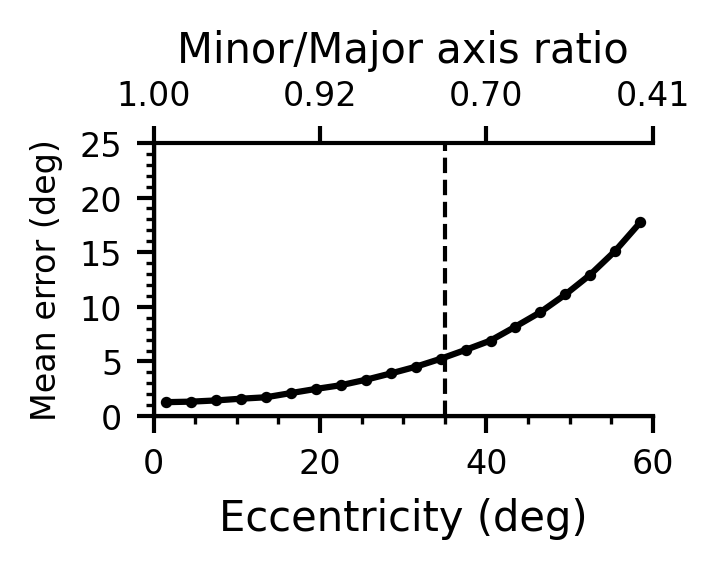

In [17]:
export_path = r'Z:\\Nimrod\\Paper_Figures\\2024_Personalized_headstage_eye_tracking\\supplementary\\kerr_accuracy_report_span60_ylim0_25.pdf'
out = plot_error_vs_ecc_with_ratio_axis_pdf(
    kerr_df,
    k=70,
    metric="total",
    r_bins=20,
    r_range=(0, 60),            # force 0..60° on bottom axis
    min_per_bin=0,
    ring_halfwidth_deg=0.5,
    figsize=(2.5, 2),
    dpi=300,
    export_pdf_path=export_path,
    font_family="Arial",
    y_range=(0,25)
)


In [47]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
%matplotlib inline
from matplotlib import rcParams
plt.style.use('default')
rcParams['pdf.fonttype'] = 42  # Ensure fonts are embedded and editable
rcParams['ps.fonttype'] = 42  # Ensure compatibility with vector outputs

def plot_error_vs_ecc_with_ratio_axis_pdf(
    df,
    k=40,                         # vertical line at R=k/2 (deg)
    metric="total",               # "total" | "phi" | "theta"
    r_bins=30,                    # # of equal-width r bins (points at bin centers)
    r_range=None,                 # (r_min, r_max) degrees; e.g., (0, 60)
    min_per_bin=20,               # drop sparse r-bins from the *binned* curve
    ring_halfwidth_deg=0.5,       # for reporting ratio@R (optional)
    figsize=(3.8, 2.6), dpi=300,
    export_pdf_path=None,
    font_family="Arial",
    y_range=None,                 # optional (ymin, ymax)
    show_cumspan=True,            # overlay dashed cumulative within-span mean curve
    cumspan_style=None,           # dict of matplotlib kwargs for the dashed curve
    show_markers=True,            # markers at bin centers for the binned curve
    marker_size=3
):
    """
    Bottom x-axis: eccentricity r (deg). Top x-axis: minor/major ratio learned from data.
    Solid curve: mean error in equal-r bins (shown at bin centers).
    Dashed curve (optional): cumulative within-span mean error vs R (mean over all r<=R).
    """
    # ---- Fonts for editable PDF text ----

    %matplotlib inline
    plt.style.use('default')
    rcParams['pdf.fonttype'] = 42  # Ensure fonts are embedded and editable
    rcParams['ps.fonttype'] = 42  # Ensure compatibility with vector outputs

    # ---- Data prep ----
    req = {"ratio2","x_angle","y_angle","phi","theta"}
    missing = req - set(df.columns)
    if missing:
        raise ValueError(f"DataFrame missing required columns: {missing}")
    d = df[list(req)].copy().dropna(subset=list(req))
    d["ratio2"] = pd.to_numeric(d["ratio2"], errors="coerce").clip(0.0, 1.0)
    d = d.dropna(subset=["ratio2"])
    d["r_xy"] = np.hypot(d["x_angle"], d["y_angle"])

    # Errors
    d["err_phi"]   = d["phi"]   - d["x_angle"]
    d["err_theta"] = d["theta"] - d["y_angle"]
    if metric == "total":
        d["error"] = np.sqrt(d["err_phi"]**2 + d["err_theta"]**2)
        ylab = "Mean total angular error (deg)"
    elif metric == "phi":
        d["error"] = np.abs(d["err_phi"]); ylab = "Mean |φ − x_angle| (deg)"
    elif metric == "theta":
        d["error"] = np.abs(d["err_theta"]); ylab = "Mean |θ − y_angle| (deg)"
    else:
        raise ValueError("metric must be 'total', 'phi', or 'theta'")

    # ---- Eccentricity bins (equal width over requested range) ----
    if r_range is None:
        r_min = float(np.nanmin(d["r_xy"])); r_max = float(np.nanmax(d["r_xy"]))
    else:
        r_min, r_max = map(float, r_range)
    r_edges = np.linspace(r_min, r_max, int(r_bins) + 1)
    r_cats  = pd.cut(d["r_xy"], r_edges, include_lowest=True)
    r_centers = np.array([iv.mid for iv in r_cats.cat.categories])

    gb = d.groupby(r_cats, observed=False).agg(
        mean_error=("error","mean"),
        n=("error","size"),
        ratio_med=("ratio2","median"),
    ).reset_index(drop=True)
    gb = gb.assign(r_center=r_centers)

    # Binned (solid) curve
    curve = gb[gb["n"] >= int(min_per_bin)].copy()

    # ---- Cumulative within-span mean vs R (dashed curve) ----
    cum_curve = None
    if show_cumspan:
        # sort by r and compute cumulative mean
        order = np.argsort(d["r_xy"].to_numpy())
        r_sorted   = d["r_xy"].to_numpy()[order]
        err_sorted = d["error"].to_numpy()[order]
        csum = np.cumsum(err_sorted)
        cnt  = np.arange(1, err_sorted.size + 1, dtype=float)
        cmean = csum / cnt
        # evaluate at the same r bin centers (within requested range)
        idx = np.searchsorted(r_sorted, r_centers, side="right")
        cum_vals = np.where(idx > 0, cmean[np.clip(idx-1, 0, cmean.size-1)], np.nan)
        cum_curve = pd.DataFrame({"r_center": r_centers, "cum_mean_error": cum_vals})
        # plot
        style = dict(linestyle="--", linewidth=1.2, alpha=0.9, color="black")
        if isinstance(cumspan_style, dict): style.update(cumspan_style)
        plt.plot(cum_curve["r_center"], cum_curve["cum_mean_error"], **style)

    # ---- Plot main figure ----
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.plot(curve["r_center"], curve["mean_error"], linewidth=1.5, color="black")
    if show_markers:
        ax.scatter(curve["r_center"], curve["mean_error"], s=marker_size, color="black", zorder=3)

    ax.set_xlim(r_min, r_max)
    if y_range is not None: ax.set_ylim(*y_range)
    ax.set_xlabel("Eccentricity (deg)", fontsize=10)
    ax.set_ylabel(ylab, fontsize=10)
    ax.tick_params(axis="both", labelsize=8, width=1.0, length=4, direction="out")
    ax.minorticks_on()
    ax.tick_params(axis="both", which="minor", width=0.8, length=2, direction="out")
    ax.yaxis.set_major_locator(MaxNLocator(5))
    for s in ("left","bottom"):
        ax.spines[s].set_visible(True); ax.spines[s].set_linewidth(1.0)
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

    # Vertical line at R=k/2
    R = float(k) / 2.0
    ax.axvline(R, linestyle="--", linewidth=1.0, color="black")

    # ---- Top x-axis: ratio labels aligned to bottom ticks ----
    ax_top = ax.twiny()
    ax_top.set_xlim(ax.get_xlim())
    bticks = ax.get_xticks()
    valid_map = gb["n"].to_numpy() > 0
    r_map = gb.loc[valid_map, "r_center"].to_numpy()
    q_map = gb.loc[valid_map, "ratio_med"].to_numpy()
    ratio_at_ticks = np.interp(bticks, r_map, q_map,
                               left=q_map[0] if q_map.size else np.nan,
                               right=q_map[-1] if q_map.size else np.nan)
    ax_top.set_xticks(bticks)
    ax_top.set_xticklabels([f"{v:.2f}" if np.isfinite(v) else "" for v in ratio_at_ticks], fontsize=8)
    ax_top.set_xlabel("Minor/Major axis ratio", fontsize=10)
    ax_top.tick_params(axis="x", width=1.0, length=4, direction="out")
    ax_top.spines["top"].set_visible(True); ax_top.spines["top"].set_linewidth(1.0)
    ax_top.spines["right"].set_visible(False)

    plt.tight_layout()

    if export_pdf_path:
        fig.savefig(export_pdf_path, bbox_inches="tight")
        print(f"Saved PDF → {export_pdf_path}")

    # brief report
    in_span = d["r_xy"] <= R
    mean_span = float(d.loc[in_span, "error"].mean()) if in_span.any() else np.nan
    print(f"k={k:g}° → R={R:.2f}°.  Within-span mean error: {mean_span:.3f}° (n={int(in_span.sum())})")

    return {
        "curve": curve[["r_center","mean_error","n","ratio_med"]].reset_index(drop=True),
        "cumspan_curve": cum_curve,    # None if show_cumspan=False
        "r_limits": (r_min, r_max),
        "R": R,
        "within_span_mean": mean_span,
    }


k=70° → R=35.00°.  Within-span mean error: 3.242° (n=4088)


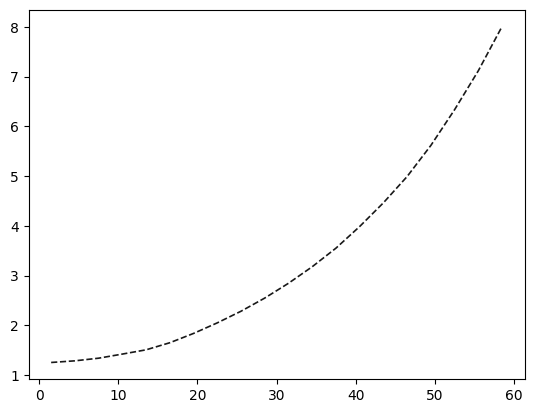

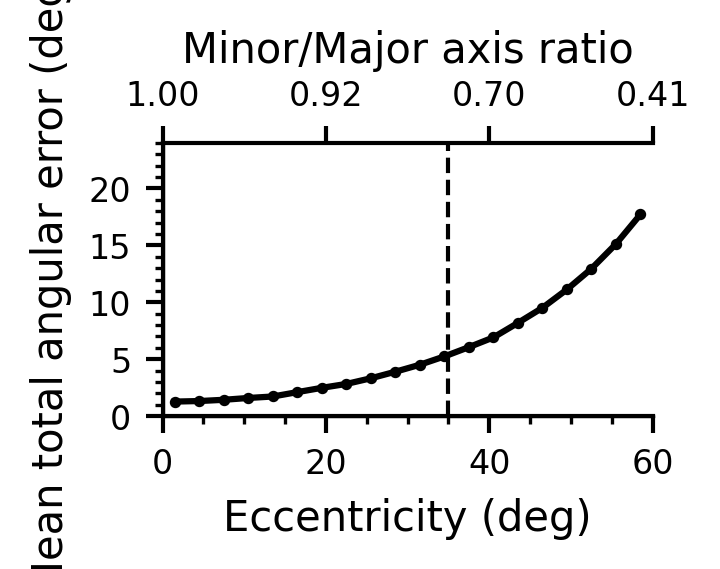

In [49]:
out = plot_error_vs_ecc_with_ratio_axis_pdf(
    kerr_df, k=70, metric="total",
    r_bins=20, r_range=(0, 60),
    min_per_bin=0, ring_halfwidth_deg=0.5,
    figsize=(2.5, 2), dpi=300,
    export_pdf_path=None,
    show_cumspan=True,  # <-- adds the dashed cumulative line
    y_range=(0, 24)     # optional: force y-axis range
)


In [50]:
# here, I'll try to correct the error for each point... first let's make a translation map:
kerr_df.columns

Index(['frame', 'x_angle', 'y_angle', 'ratio2', 'ratio1', 'r', 'theta', 'phi'], dtype='object')

In [51]:
kerr_df['x_error'] = kerr_df['x_angle'] - kerr_df['phi']
kerr_df['y_error'] = kerr_df['y_angle'] - kerr_df['theta']


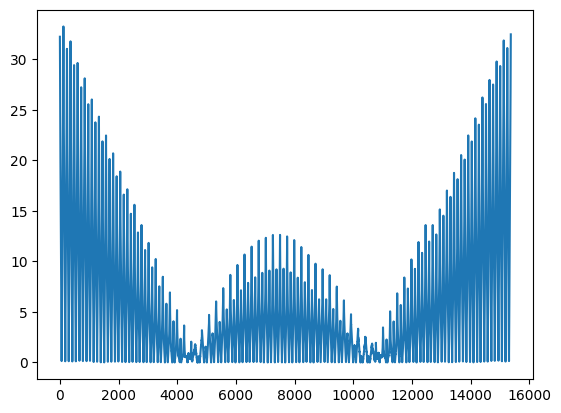

In [56]:
plt.plot(np.abs(kerr_df['x_error']))

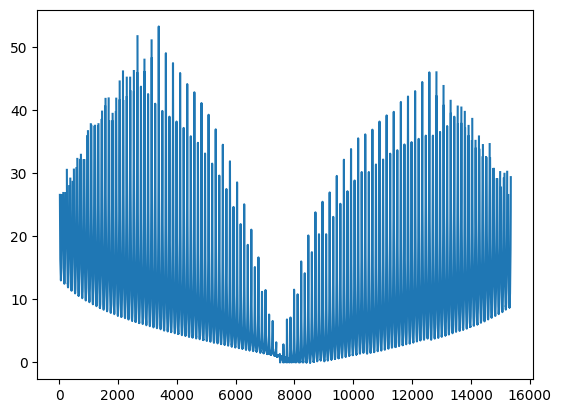

In [57]:
plt.plot(np.abs(kerr_df['y_error']))

In [58]:
# visualization function from gpt:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from dataclasses import dataclass
from pathlib import Path

# Optional smoothers / interpolators (used if available)
try:
    from scipy.ndimage import gaussian_filter
    from scipy.interpolate import RegularGridInterpolator
    _HAS_SCIPY = True
except Exception:
    _HAS_SCIPY = False

@dataclass
class KerrCorrection:
    # Grid axes (bin centers)
    x_true: np.ndarray      # for err(true→·)
    y_true: np.ndarray
    x_pred: np.ndarray      # for err(pred→·)
    y_pred: np.ndarray
    # Surfaces (median errors per bin)
    dx_true: np.ndarray
    dy_true: np.ndarray
    n_true:  np.ndarray     # counts per bin
    dx_pred: np.ndarray
    dy_pred: np.ndarray
    n_pred:  np.ndarray
    # Interpolators (None if SciPy not present)
    f_dx_pred: object
    f_dy_pred: object

    def correct_pred(self, phi, theta):
        """
        Correct model outputs using the err(pred→·) map.
        Input arrays or floats of phi, theta (deg) -> returns corrected (phi_corr, theta_corr).
        Falls back to nearest-neighbor if SciPy not available.
        """
        phi = np.asarray(phi)
        theta = np.asarray(theta)
        if _HAS_SCIPY and self.f_dx_pred is not None:
            pts = np.stack([phi, theta], axis=-1)
            dpx = self.f_dx_pred(pts)
            dpy = self.f_dy_pred(pts)
        else:
            # nearest neighbor on the LUT grid
            ix = np.clip(np.searchsorted(self.x_pred, phi) - 1, 0, len(self.x_pred)-1)
            iy = np.clip(np.searchsorted(self.y_pred, theta) - 1, 0, len(self.y_pred)-1)
            dpx = self.dx_pred[iy, ix]
            dpy = self.dy_pred[iy, ix]
        return phi + dpx, theta + dpy

def _nan_gaussian(img, sigma):
    """NaN-aware Gaussian smoothing (keeps NaNs where there is no support)."""
    if sigma is None or sigma <= 0 or not _HAS_SCIPY:
        return img
    valid = np.isfinite(img).astype(float)
    img0 = np.where(np.isfinite(img), img, 0.0)
    num = gaussian_filter(img0, sigma=sigma, mode='nearest')
    den = gaussian_filter(valid, sigma=sigma, mode='nearest')
    with np.errstate(invalid='ignore', divide='ignore'):
        out = num / den
    out[den < 1e-6] = np.nan
    return out

def _bin_medians(x, y, val, x_edges, y_edges):
    """2D bin medians + counts on a regular grid."""
    xi = np.clip(np.digitize(x, x_edges) - 1, 0, len(x_edges)-2)
    yi = np.clip(np.digitize(y, y_edges) - 1, 0, len(y_edges)-2)
    H = np.full((len(y_edges)-1, len(x_edges)-1), np.nan, float)
    N = np.zeros_like(H, dtype=int)
    # accumulate lists per bin efficiently
    idx = yi * (len(x_edges)-1) + xi
    order = np.argsort(idx)
    idx_sorted = idx[order]
    val_sorted = val[order]
    # run-length over bins
    start = 0
    while start < len(idx_sorted):
        stop = start + 1
        while stop < len(idx_sorted) and idx_sorted[stop] == idx_sorted[start]:
            stop += 1
        flat_bin = idx_sorted[start]
        j = flat_bin % (len(x_edges)-1)
        i = flat_bin // (len(x_edges)-1)
        v = val_sorted[start:stop]
        v = v[np.isfinite(v)]
        if v.size:
            H[i, j] = np.median(v)
            N[i, j] = v.size
        start = stop
    return H, N

def build_kerr_correction_and_viz(
    kerr_df,
    x_col='x_angle', y_col='y_angle',        # ground truth (deg)
    phi_col='phi', theta_col='theta',        # model outputs (deg)
    dx_col='x_error', dy_col='y_error',      # gt - pred (you created already)
    grid_limits=(-60, 60, -60, 60),          # xmin, xmax, ymin, ymax (deg)
    bins=25,                                 # per axis (int or (nx, ny))
    smooth_sigma=1.0,                        # Gaussian sigma in bins (None/0 disables)
    min_per_bin=5,                           # show quiver only where we have enough samples
    export_dir=None,                         # Pathlike; saves PNGs and LUT CSV/NPZ if set
    export_prefix="kerr_correction",
    show=True,
    figsize=(9, 7),
    font_family="Arial"
) -> KerrCorrection:
    """
    Build & visualize correction maps for a reprojection algorithm and save a reusable LUT.
    Returns a KerrCorrection object with correction surfaces and an apply() helper.
    """
    df = kerr_df.copy()

    # Basic arrays
    x_true = df[x_col].to_numpy(float)
    y_true = df[y_col].to_numpy(float)
    x_pred = df[phi_col].to_numpy(float)
    y_pred = df[theta_col].to_numpy(float)
    dx = df[dx_col].to_numpy(float)  # (true - pred) in x
    dy = df[dy_col].to_numpy(float)  # (true - pred) in y

    # Grids
    xmin, xmax, ymin, ymax = grid_limits
    if isinstance(bins, int):
        nx = ny = int(bins)
    else:
        nx, ny = bins
    x_edges = np.linspace(xmin, xmax, nx+1)
    y_edges = np.linspace(ymin, ymax, ny+1)
    x_cent = 0.5*(x_edges[:-1] + x_edges[1:])
    y_cent = 0.5*(y_edges[:-1] + y_edges[1:])

    # --- Maps as a function of TRUE (diagnostic) ---
    dx_true, n_true = _bin_medians(x_true, y_true, dx, x_edges, y_edges)
    dy_true, _      = _bin_medians(x_true, y_true, dy, x_edges, y_edges)

    dx_true_s = _nan_gaussian(dx_true, smooth_sigma)
    dy_true_s = _nan_gaussian(dy_true, smooth_sigma)

    # --- Maps as a function of PRED (operational LUT) ---
    dx_pred, n_pred = _bin_medians(x_pred, y_pred, dx, x_edges, y_edges)
    dy_pred, _      = _bin_medians(x_pred, y_pred, dy, x_edges, y_edges)

    dx_pred_s = _nan_gaussian(dx_pred, smooth_sigma)
    dy_pred_s = _nan_gaussian(dy_pred, smooth_sigma)

    # Interpolators (for applying to future predictions)
    if _HAS_SCIPY:
        f_dx_pred = RegularGridInterpolator((x_cent, y_cent), dx_pred_s.T, bounds_error=False, fill_value=np.nan)
        f_dy_pred = RegularGridInterpolator((x_cent, y_cent), dy_pred_s.T, bounds_error=False, fill_value=np.nan)
    else:
        f_dx_pred = f_dy_pred = None

    # ---------- Visualization ----------
    plt.rcParams['font.family'] = font_family
    fig = plt.figure(figsize=figsize, dpi=150)
    gs = fig.add_gridspec(2, 3, width_ratios=[1,1,0.12], height_ratios=[1,1], wspace=0.25, hspace=0.25)

    def heat(ax, Xc, Yc, Z, title, symmetric=True):
        if symmetric:
            vabs = np.nanpercentile(np.abs(Z), 95)
            norm = TwoSlopeNorm(vmin=-vabs, vcenter=0.0, vmax=vabs)
        else:
            vmin = np.nanpercentile(Z, 5)
            vmax = np.nanpercentile(Z, 95)
            norm = None
        im = ax.imshow(Z, origin='lower',
                       extent=[Xc[0], Xc[-1], Yc[0], Yc[-1]],
                       aspect='equal', cmap='coolwarm', norm=norm)
        ax.set_title(title, fontsize=11)
        ax.set_xlabel('x (deg)')
        ax.set_ylabel('y (deg)')
        return im

    # Top row: error maps vs TRUE
    ax1 = fig.add_subplot(gs[0,0])
    im1 = heat(ax1, x_cent, y_cent, dx_true_s, r"$\Delta x$ (true→·) [deg]")
    ax2 = fig.add_subplot(gs[0,1])
    im2 = heat(ax2, x_cent, y_cent, dy_true_s, r"$\Delta y$ (true→·) [deg]")
    cax_t = fig.add_subplot(gs[0,2])
    cb1 = fig.colorbar(im1, cax=cax_t)
    cb1.set_label('deg')

    # Bottom row: error maps vs PRED (the LUT you’ll apply)
    ax3 = fig.add_subplot(gs[1,0])
    im3 = heat(ax3, x_cent, y_cent, dx_pred_s, r"$\Delta x$ (pred→·) [deg]")
    ax4 = fig.add_subplot(gs[1,1])
    im4 = heat(ax4, x_cent, y_cent, dy_pred_s, r"$\Delta y$ (pred→·) [deg]")
    cax_b = fig.add_subplot(gs[1,2])
    cb2 = fig.colorbar(im3, cax=cax_b)
    cb2.set_label('deg')

    # Quiver overlays for pred→· on ax3/ax4 (where enough samples exist)
    # Draw on ax3 only to avoid clutter; color by magnitude
    mag = np.hypot(dx_pred_s, dy_pred_s)
    mask = (n_pred >= min_per_bin) & np.isfinite(mag)
    step = max(1, int(max(nx, ny)//20))  # thin arrows on dense grids
    Yg, Xg = np.meshgrid(y_cent, x_cent, indexing='xy')
    Xq = Xg[mask.T][::step]
    Yq = Yg[mask.T][::step]
    Uq = dx_pred_s.T[mask.T][::step]
    Vq = dy_pred_s.T[mask.T][::step]
    mq = np.hypot(Uq, Vq)
    q = ax3.quiver(Xq, Yq, Uq, Vq, mq, angles='xy', scale_units='xy', scale=1.0, alpha=0.75)
    ax3.set_title(r"$\Delta$ (pred→·) field + heat")

    # Marginal histograms for dx, dy (quick sanity check)
    fig2, axes = plt.subplots(1, 2, figsize=(6.2, 2.4), dpi=150)
    for a, data, lab in zip(axes, [dx, dy], [r'$\Delta x$ (deg)', r'$\Delta y$ (deg)']):
        a.hist(np.clip(data, -10, 10), bins=60, density=True)
        a.set_xlabel(lab); a.set_ylabel('pdf'); a.set_title('Error distribution')
        a.axvline(0, lw=1, ls='--')
    fig2.tight_layout()

    if export_dir is not None:
        export_dir = Path(export_dir)
        export_dir.mkdir(parents=True, exist_ok=True)
        # Save PNGs
        fig.savefig(export_dir / f"{export_prefix}_maps.png", dpi=300, bbox_inches='tight')
        fig2.savefig(export_dir / f"{export_prefix}_hist.png", dpi=300, bbox_inches='tight')
        # Save LUTs (CSV for convenience; NPZ for exact)
        pred_df = pd.DataFrame({
            'phi_center_deg': np.repeat(x_cent, len(y_cent)),
            'theta_center_deg': np.tile(y_cent, len(x_cent)),
            'dx_pred_deg': dx_pred_s.T.reshape(-1),
            'dy_pred_deg': dy_pred_s.T.reshape(-1),
            'count': n_pred.T.reshape(-1),
        })
        pred_df.to_csv(export_dir / f"{export_prefix}_pred_LUT.csv", index=False)
        true_df = pd.DataFrame({
            'x_center_deg': np.repeat(x_cent, len(y_cent)),
            'y_center_deg': np.tile(y_cent, len(x_cent)),
            'dx_true_deg': dx_true_s.T.reshape(-1),
            'dy_true_deg': dy_true_s.T.reshape(-1),
            'count': n_true.T.reshape(-1),
        })
        true_df.to_csv(export_dir / f"{export_prefix}_true_diag.csv", index=False)
        np.savez(
            export_dir / f"{export_prefix}_grids.npz",
            x_true=x_cent, y_true=y_cent,
            x_pred=x_cent, y_pred=y_cent,
            dx_true=dx_true_s, dy_true=dy_true_s, n_true=n_true,
            dx_pred=dx_pred_s, dy_pred=dy_pred_s, n_pred=n_pred,
        )

    if show:
        plt.show()
    else:
        plt.close(fig); plt.close(fig2)

    kc = KerrCorrection(
        x_true=x_cent, y_true=y_cent, x_pred=x_cent, y_pred=y_cent,
        dx_true=dx_true_s, dy_true=dy_true_s, n_true=n_true,
        dx_pred=dx_pred_s, dy_pred=dy_pred_s, n_pred=n_pred,
        f_dx_pred=(f_dx_pred if _HAS_SCIPY else None),
        f_dy_pred=(f_dy_pred if _HAS_SCIPY else None),
    )
    # Attach for convenience
    kc.f_dy_pred = (RegularGridInterpolator((x_cent, y_cent), dy_pred_s.T, bounds_error=False, fill_value=np.nan)
                    if _HAS_SCIPY else None)
    return kc


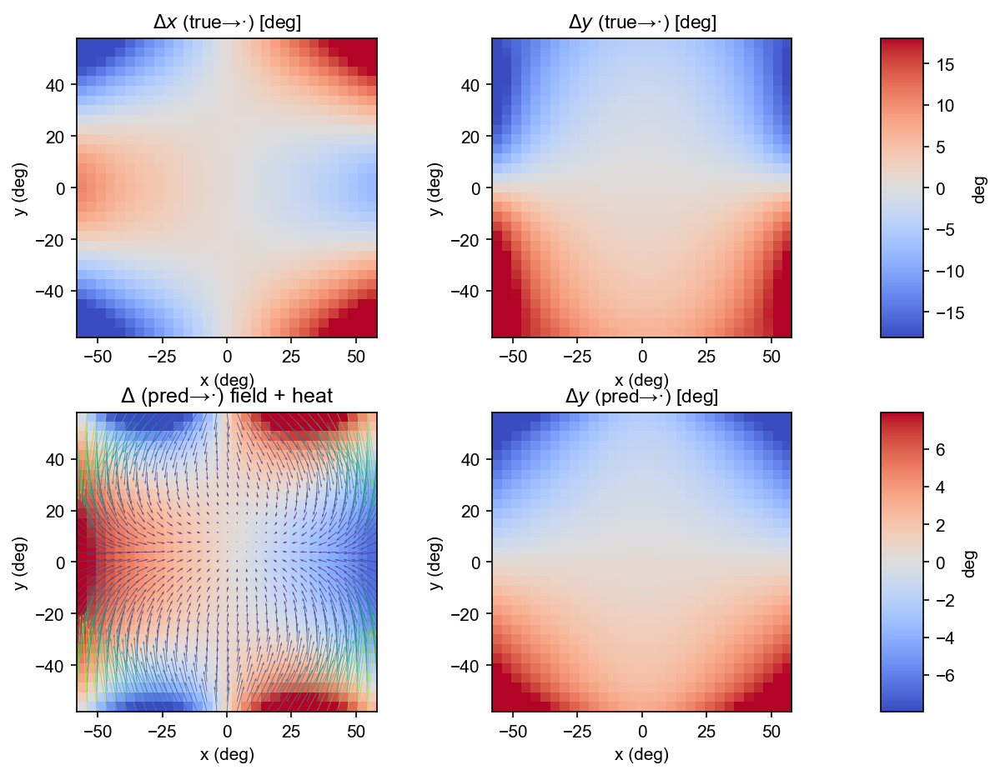

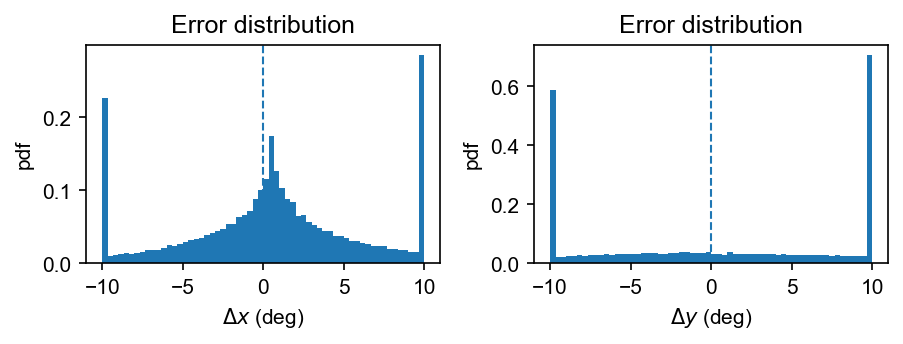

In [62]:
# 1) Build + visualize + save
kc = build_kerr_correction_and_viz(
    kerr_df,
    grid_limits=(-60,60,-60,60),
    bins=31,
    smooth_sigma=1.2,
    min_per_bin=1,
    export_dir="analysis/kerr_viz",
    export_prefix="v1"
)

# 2) Correct new model outputs (phi, theta) using the learned LUT:
phi_raw  = np.array([ -15.0,  12.3,  44.1])
theta_raw= np.array([  20.5, -30.2, -10.0])
phi_corr, theta_corr = kc.correct_pred(phi_raw, theta_raw)


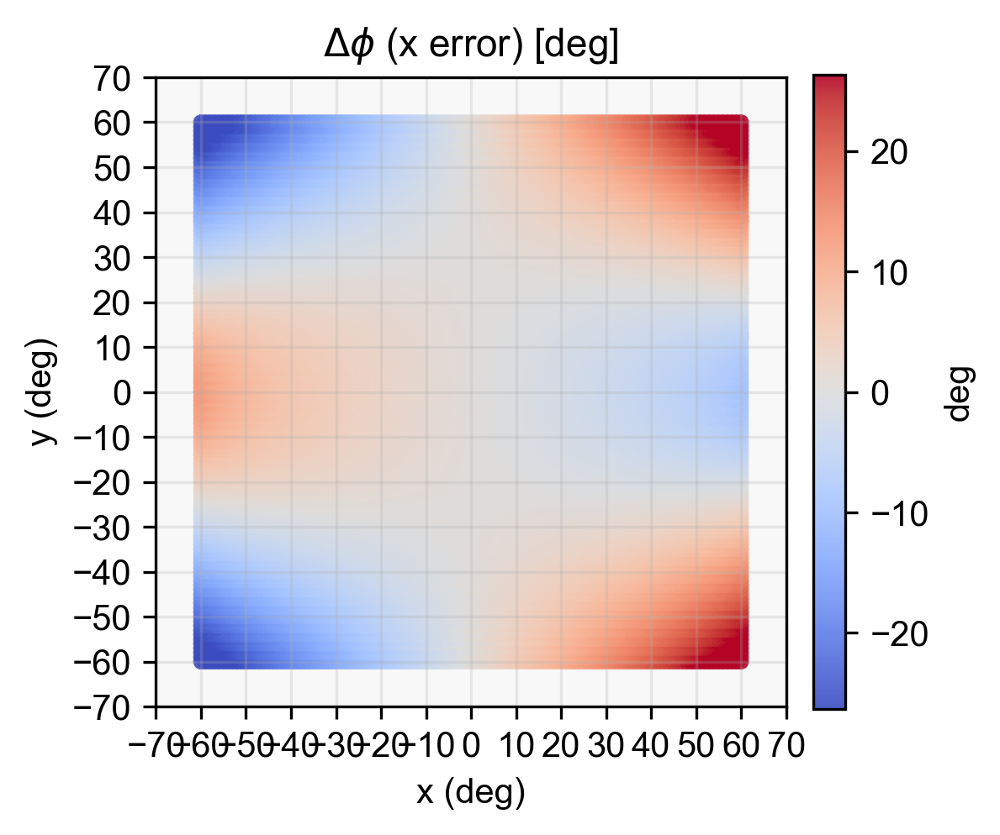

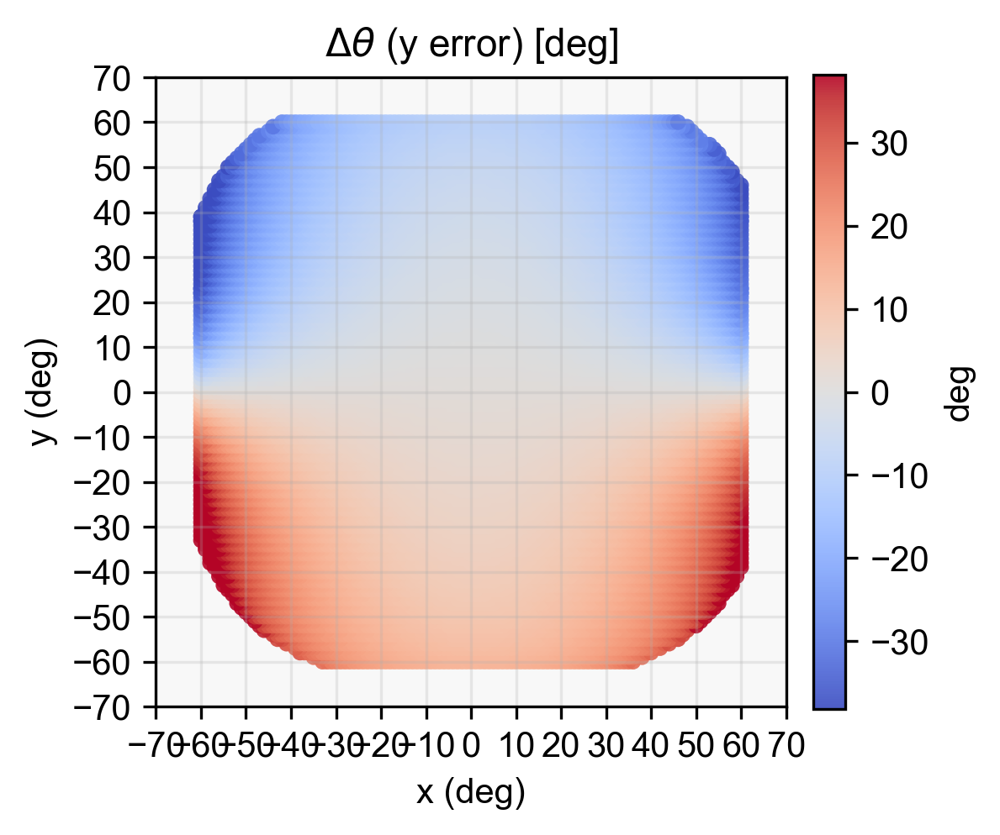

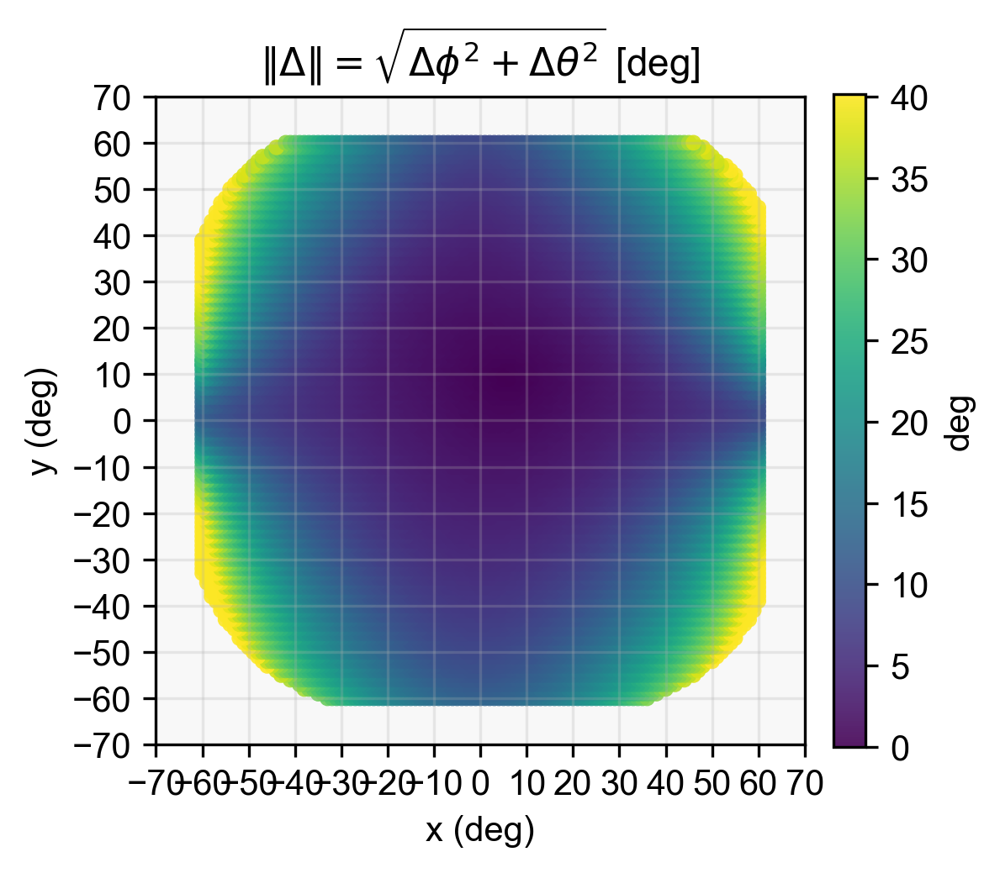

In [64]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from pathlib import Path

# Embed editable fonts in vector outputs (Illustrator-friendly)
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype']  = 42

def plot_kerr_scatter_grids(
    kerr_df: pd.DataFrame,
    x_col='x_angle', y_col='y_angle',
    dx_col='x_error', dy_col='y_error',
    grid_limits=(-60, 60, -60, 60),   # xmin, xmax, ymin, ymax (deg)
    grid_step=10,                     # major grid spacing (deg)
    point_size=18,                    # scatter marker size
    alpha=0.9,                        # marker alpha
    clip_percentile=99,               # robust color scale (per-axis); 95–99 works well
    mag_clip_percentile=99,           # robust color scale for magnitude plot
    cmap_signed='coolwarm',           # diverging for signed errors
    cmap_mag='viridis',               # sequential for magnitude
    figsize=(4.0, 3.6),
    font_family='Arial',
    save=True,
    export_dir=None,                  # e.g. "analysis/kerr_scatter"
    export_prefix='kerr_scatter',
    dpi=300,
    show=True
):
    """
    Create three scatter plots on a rectangular (x,y) grid:
      1) Color = x_error (phi error)  [diverging colormap centered at 0]
      2) Color = y_error (theta error)[diverging colormap centered at 0]
      3) Color = sqrt(x_error^2 + y_error^2)  [sequential colormap]
    """
    assert {x_col, y_col, dx_col, dy_col} <= set(kerr_df.columns), "kerr_df missing required columns."

    # Extract arrays
    x = kerr_df[x_col].to_numpy(float)
    y = kerr_df[y_col].to_numpy(float)
    dx = kerr_df[dx_col].to_numpy(float)
    dy = kerr_df[dy_col].to_numpy(float)

    # Combined magnitude
    dmag = np.hypot(dx, dy)

    # Robust color limits (ignore NaNs)
    def robust_limits_signed(v, p=99):
        v = v[np.isfinite(v)]
        if v.size == 0:
            return -1.0, 1.0
        vabs = np.percentile(np.abs(v), p)
        if vabs <= 0:
            vabs = np.nanmax(np.abs(v)) if np.isfinite(np.nanmax(np.abs(v))) else 1.0
        return -vabs, vabs

    def robust_limits_mag(v, p=99):
        v = v[np.isfinite(v)]
        if v.size == 0:
            return 0.0, 1.0
        lo, hi = 0.0, np.percentile(v, p)
        if hi <= lo:
            hi = float(np.nanmax(v)) if np.isfinite(np.nanmax(v)) else 1.0
        return lo, hi

    vmin_x, vmax_x = robust_limits_signed(dx, clip_percentile)
    vmin_y, vmax_y = robust_limits_signed(dy, clip_percentile)
    vmin_m, vmax_m = robust_limits_mag(dmag, mag_clip_percentile)

    # Common axes setup helper
    def setup_axes(ax, title):
        xmin, xmax, ymin, ymax = grid_limits
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlabel('x (deg)')
        ax.set_ylabel('y (deg)')
        ax.set_title(title, fontsize=11)
        # Grid lines on a rectangular lattice
        ax.set_xticks(np.arange(np.ceil(xmin / grid_step) * grid_step, xmax + 1e-9, grid_step))
        ax.set_yticks(np.arange(np.ceil(ymin / grid_step) * grid_step, ymax + 1e-9, grid_step))
        ax.grid(True, which='major', linewidth=0.8, alpha=0.25)
        ax.set_facecolor('#f8f8f8')

    plt.rcParams['font.family'] = font_family

    # -------- Plot 1: phi error (x_error) --------
    fig1, ax1 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax1, r'$\Delta \phi$ (x error) [deg]')
    norm_x = TwoSlopeNorm(vmin=vmin_x, vcenter=0.0, vmax=vmax_x)
    sc1 = ax1.scatter(x, y, c=dx, s=point_size, cmap=cmap_signed, norm=norm_x, alpha=alpha, edgecolors='none', rasterized=True)
    cb1 = fig1.colorbar(sc1, ax=ax1, fraction=0.046, pad=0.04)
    cb1.set_label('deg')

    # -------- Plot 2: theta error (y_error) --------
    fig2, ax2 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax2, r'$\Delta \theta$ (y error) [deg]')
    norm_y = TwoSlopeNorm(vmin=vmin_y, vcenter=0.0, vmax=vmax_y)
    sc2 = ax2.scatter(x, y, c=dy, s=point_size, cmap=cmap_signed, norm=norm_y, alpha=alpha, edgecolors='none', rasterized=True)
    cb2 = fig2.colorbar(sc2, ax=ax2, fraction=0.046, pad=0.04)
    cb2.set_label('deg')

    # -------- Plot 3: combined magnitude --------
    fig3, ax3 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax3, r'$\|\Delta\| = \sqrt{\Delta \phi^2 + \Delta \theta^2}$ [deg]')
    sc3 = ax3.scatter(x, y, c=dmag, s=point_size, cmap=cmap_mag, vmin=vmin_m, vmax=vmax_m, alpha=alpha, edgecolors='none', rasterized=True)
    cb3 = fig3.colorbar(sc3, ax=ax3, fraction=0.046, pad=0.04)
    cb3.set_label('deg')

    fig1.tight_layout()
    fig2.tight_layout()
    fig3.tight_layout()

    # Optional saving
    if save:
        outdir = Path(export_dir or ".")
        outdir.mkdir(parents=True, exist_ok=True)
        for i, fig in enumerate([fig1, fig2, fig3], start=1):
            fig.savefig(outdir / f"{export_prefix}_{i:02d}.pdf", bbox_inches='tight')
            fig.savefig(outdir / f"{export_prefix}_{i:02d}.png", bbox_inches='tight', dpi=dpi)

    if show:
        plt.show()
    else:
        plt.close(fig1); plt.close(fig2); plt.close(fig3)

plot_kerr_scatter_grids(
    kerr_df,
    grid_limits=(-70,70,-70,70),
    grid_step=10,
    point_size=20,
    clip_percentile=99,
    mag_clip_percentile=99,
    export_dir="analysis/kerr_scatter_v2",
    export_prefix="gt_scatter",
    save=False,
    show=True
)


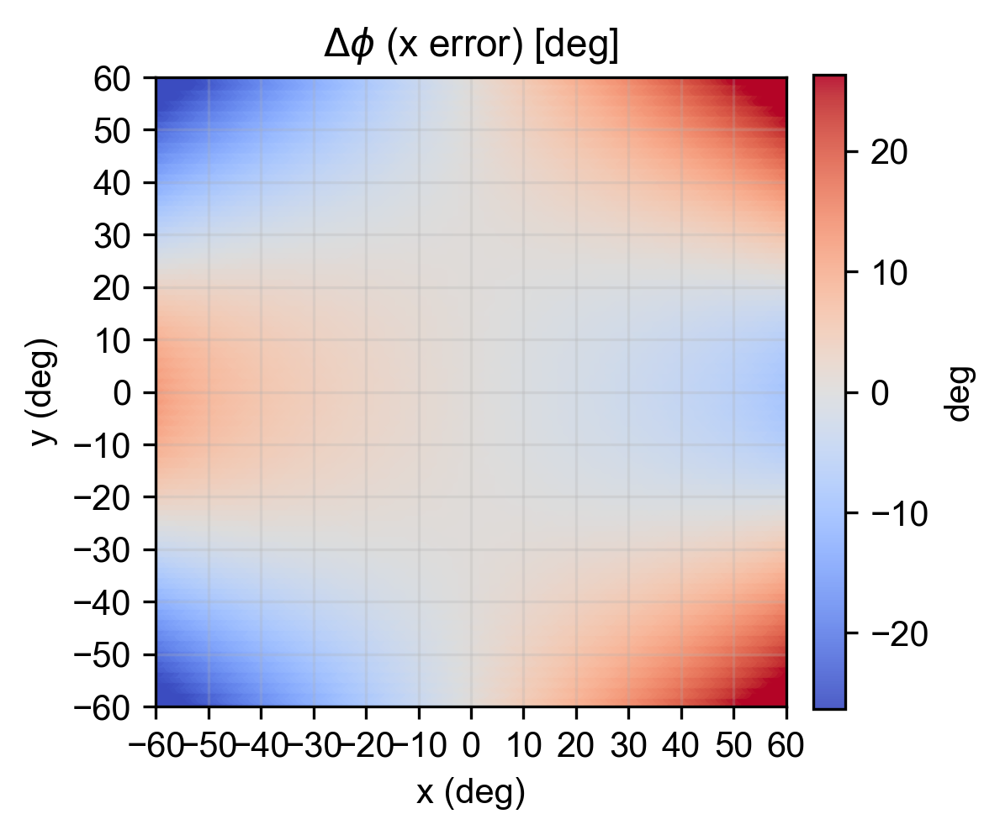

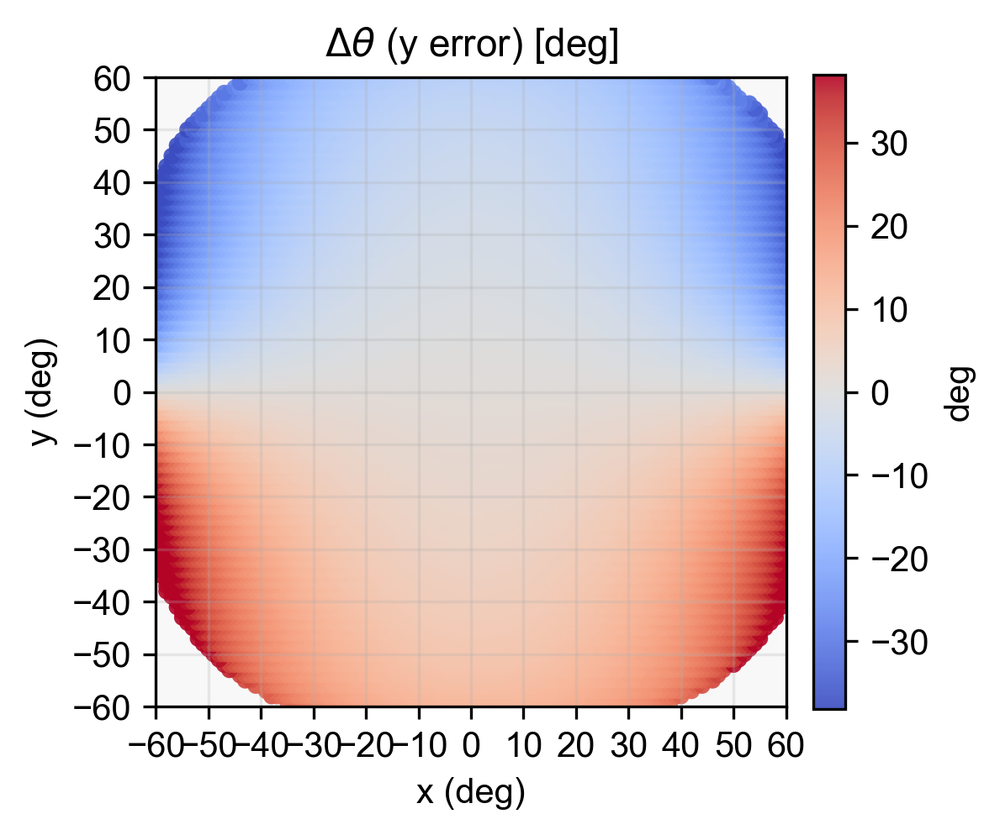

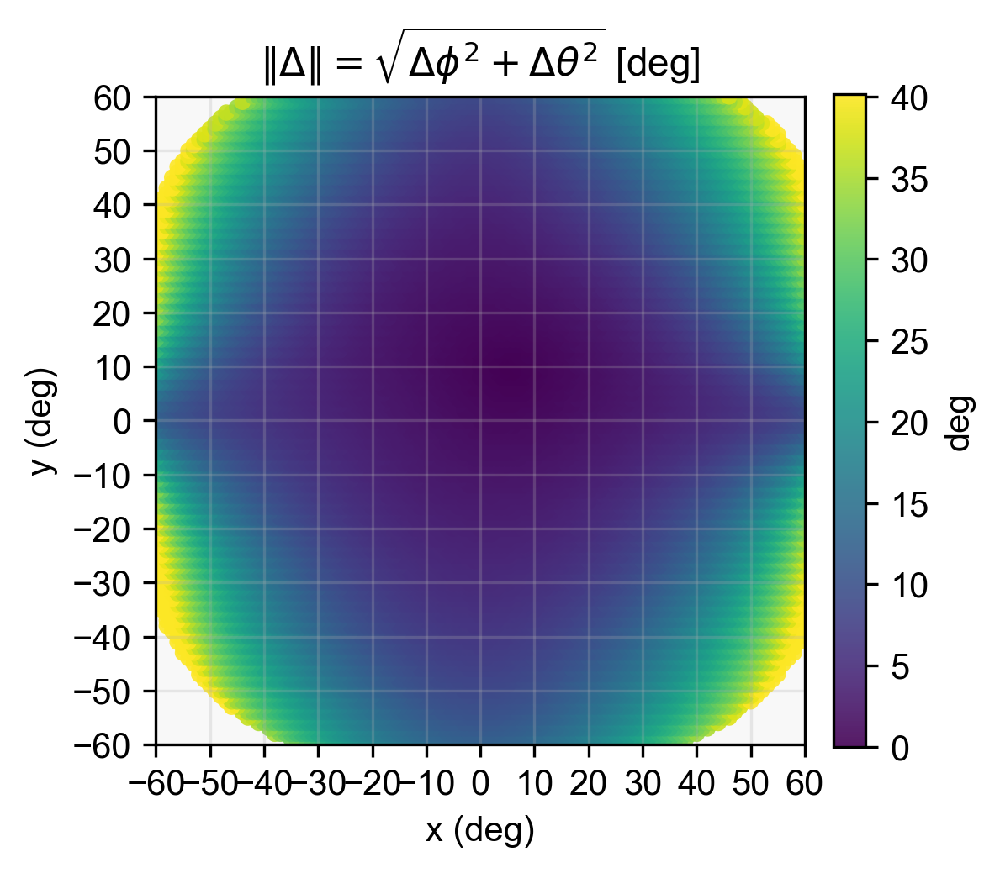

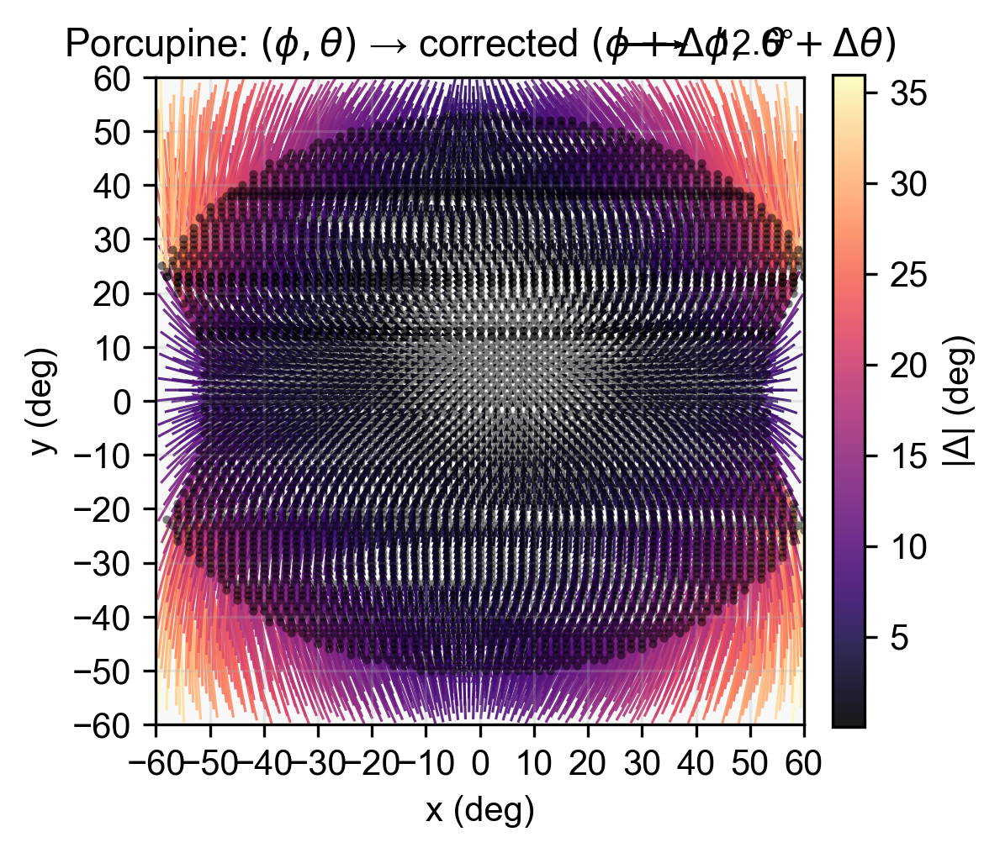

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from pathlib import Path
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype']  = 42

def plot_kerr_scatter_grids(
    kerr_df: pd.DataFrame,
    x_col='x_angle', y_col='y_angle',          # ground truth
    phi_col='phi', theta_col='theta',          # model outputs
    dx_col='x_error', dy_col='y_error',        # true - pred = correction
    grid_limits=(-60, 60, -60, 60),
    grid_step=10,
    point_size=18,
    alpha=0.9,
    clip_percentile=99,
    mag_clip_percentile=99,
    cmap_signed='coolwarm',
    cmap_mag='viridis',
    figsize=(4.0, 3.6),
    font_family='Arial',
    # --- porcupine options ---
    make_porcupine=True,
    quiver_decim=1,         # integer stride for thinning arrows (e.g., 2 plots every 2nd sample)
    quiver_alpha=0.9,
    quiver_width=0.004,     # thickness of arrows
    quiver_scale=1.0,       # 1.0 => arrow length equals error in degrees
    quiver_cmap='magma',    # colormap for arrow magnitude
    save=True,
    export_dir=None,
    export_prefix='kerr_scatter',
    dpi=300,
    show=True
):
    """
    Creates 4 figures:
      1) Scatter on (x_angle, y_angle) colored by Δφ = x_error (signed)
      2) Scatter on (x_angle, y_angle) colored by Δθ = y_error (signed)
      3) Scatter on (x_angle, y_angle) colored by |Δ| = sqrt(Δφ²+Δθ²)
      4) Porcupine/quiver: arrows from (φ,θ) to corrected (φ+Δφ, θ+Δθ) = (x_angle,y_angle)
         - Arrow direction = needed correction; color = |Δ|.
    """
    assert {x_col, y_col, phi_col, theta_col, dx_col, dy_col} <= set(kerr_df.columns), "Missing required columns"

    # --- data ---
    x  = kerr_df[x_col].to_numpy(float)
    y  = kerr_df[y_col].to_numpy(float)
    ph = kerr_df[phi_col].to_numpy(float)
    th = kerr_df[theta_col].to_numpy(float)
    dx = kerr_df[dx_col].to_numpy(float)
    dy = kerr_df[dy_col].to_numpy(float)
    dmag = np.hypot(dx, dy)

    def robust_limits_signed(v, p=99):
        v = v[np.isfinite(v)]
        if v.size == 0: return -1.0, 1.0
        vabs = np.percentile(np.abs(v), p)
        if vabs <= 0:
            vmax = np.nanmax(np.abs(v))
            vabs = 1.0 if not np.isfinite(vmax) else vmax
        return -vabs, vabs

    def robust_limits_mag(v, p=99):
        v = v[np.isfinite(v)]
        if v.size == 0: return 0.0, 1.0
        lo, hi = 0.0, np.percentile(v, p)
        if hi <= lo:
            vmax = np.nanmax(v); hi = 1.0 if not np.isfinite(vmax) else vmax
        return lo, hi

    vmin_x, vmax_x = robust_limits_signed(dx, clip_percentile)
    vmin_y, vmax_y = robust_limits_signed(dy, clip_percentile)
    vmin_m, vmax_m = robust_limits_mag(dmag, mag_clip_percentile)

    def setup_axes(ax, title):
        xmin, xmax, ymin, ymax = grid_limits
        ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlabel('x (deg)'); ax.set_ylabel('y (deg)')
        ax.set_title(title, fontsize=11)
        ax.set_xticks(np.arange(np.ceil(xmin/grid_step)*grid_step, xmax+1e-9, grid_step))
        ax.set_yticks(np.arange(np.ceil(ymin/grid_step)*grid_step, ymax+1e-9, grid_step))
        ax.grid(True, which='major', linewidth=0.8, alpha=0.25)
        ax.set_facecolor('#f8f8f8')

    plt.rcParams['font.family'] = font_family

    # ---- 1) Δφ on GT grid ----
    fig1, ax1 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax1, r'$\Delta \phi$ (x error) [deg]')
    norm_x = TwoSlopeNorm(vmin=vmin_x, vcenter=0.0, vmax=vmax_x)
    sc1 = ax1.scatter(x, y, c=dx, s=point_size, cmap=cmap_signed, norm=norm_x,
                      alpha=alpha, edgecolors='none', rasterized=True)
    cb1 = fig1.colorbar(sc1, ax=ax1, fraction=0.046, pad=0.04); cb1.set_label('deg')
    fig1.tight_layout()

    # ---- 2) Δθ on GT grid ----
    fig2, ax2 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax2, r'$\Delta \theta$ (y error) [deg]')
    norm_y = TwoSlopeNorm(vmin=vmin_y, vcenter=0.0, vmax=vmax_y)
    sc2 = ax2.scatter(x, y, c=dy, s=point_size, cmap=cmap_signed, norm=norm_y,
                      alpha=alpha, edgecolors='none', rasterized=True)
    cb2 = fig2.colorbar(sc2, ax=ax2, fraction=0.046, pad=0.04); cb2.set_label('deg')
    fig2.tight_layout()

    # ---- 3) |Δ| on GT grid ----
    fig3, ax3 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax3, r'$\|\Delta\| = \sqrt{\Delta \phi^2 + \Delta \theta^2}$ [deg]')
    sc3 = ax3.scatter(x, y, c=dmag, s=point_size, cmap=cmap_mag, vmin=vmin_m, vmax=vmax_m,
                      alpha=alpha, edgecolors='none', rasterized=True)
    cb3 = fig3.colorbar(sc3, ax=ax3, fraction=0.046, pad=0.04); cb3.set_label('deg')
    fig3.tight_layout()

    # ---- 4) Porcupine: (φ,θ) → (φ+Δφ, θ+Δθ) ----
    figs = [fig1, fig2, fig3]
    if make_porcupine:
        fig4, ax4 = plt.subplots(figsize=figsize, dpi=dpi)
        setup_axes(ax4, r'Porcupine: $(\phi,\theta)$ → corrected $(\phi+\Delta\phi,\ \theta+\Delta\theta)$')
        # Keep only finite and inside bounds
        xmin, xmax, ymin, ymax = grid_limits
        mask = (
            np.isfinite(ph) & np.isfinite(th) &
            np.isfinite(dx) & np.isfinite(dy) &
            (ph >= xmin) & (ph <= xmax) & (th >= ymin) & (th <= ymax)
        )
        ph_m = ph[mask]; th_m = th[mask]
        dx_m = dx[mask]; dy_m = dy[mask]
        mag_m = np.hypot(dx_m, dy_m)

        # Decimate if requested to avoid clutter
        if isinstance(quiver_decim, int) and quiver_decim > 1:
            ph_m = ph_m[::quiver_decim]; th_m = th_m[::quiver_decim]
            dx_m = dx_m[::quiver_decim]; dy_m = dy_m[::quiver_decim]
            mag_m = mag_m[::quiver_decim]

        # Draw quiver: starts at (φ,θ), vector = (Δφ, Δθ)
        q = ax4.quiver(
            ph_m, th_m, dx_m, dy_m, mag_m,
            cmap=quiver_cmap, angles='xy', scale_units='xy', scale=1.0/quiver_scale,
            width=quiver_width, alpha=quiver_alpha
        )
        cb4 = fig4.colorbar(q, ax=ax4, fraction=0.046, pad=0.04)
        cb4.set_label('|Δ| (deg)')

        # Optional: show endpoints faintly (the corrected, i.e., ground truth)
        ax4.scatter(ph_m + dx_m, th_m + dy_m, s=6, alpha=0.5, color='k', linewidths=0, zorder=2, rasterized=True)

        # A small reference key for arrow length (e.g., 5°)
        try:
            ref = np.nanpercentile(mag_m, 80)
            if np.isfinite(ref) and ref > 0:
                ax4.quiverkey(q, X=0.82, Y=1.05, U=ref,
                              label=f'{ref:.1f}°', labelpos='E', coordinates='axes')
        except Exception:
            pass

        fig4.tight_layout()
        figs.append(fig4)

    # Save
    if save:
        outdir = Path(export_dir or ".")
        outdir.mkdir(parents=True, exist_ok=True)
        for i, fig in enumerate(figs, start=1):
            fig.savefig(outdir / f"{export_prefix}_{i:02d}.pdf", bbox_inches='tight')
            fig.savefig(outdir / f"{export_prefix}_{i:02d}.png", bbox_inches='tight', dpi=dpi)

    if show:
        plt.show()
    else:
        for fig in figs: plt.close(fig)


plot_kerr_scatter_grids(
    kerr_df,
    grid_limits=(-60,60,-60,60),
    grid_step=10,
    point_size=22,
    quiver_decim=2,            # thin arrows if dense
    quiver_scale=1.0,          # 1.0 → 1 deg = 1 axis unit
    export_dir=None,
    export_prefix="gt_scatter_with_porcupine",
    save=True,
    show=True
)


(-65.0, -30.0)

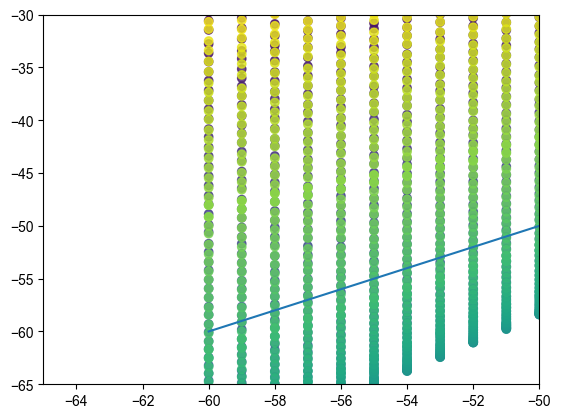

In [82]:
x = kerr_df['x_angle'].values
y = kerr_df['phi'].values
theta = kerr_df['y_angle']
plt.scatter(x,y,c=theta, alpha=0.8)
plt.plot([-60,60],[-60,60])
plt.xlim(-65,-50)
plt.ylim(-65,-30)

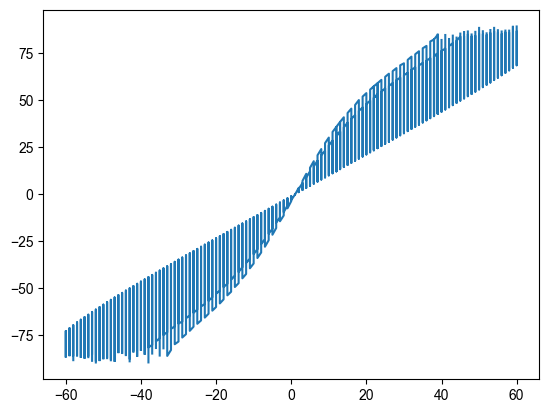

In [67]:
x = kerr_df['y_angle'].values
y = kerr_df['theta'].values
plt.plot(x,y)

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from pathlib import Path
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype']  = 42

def plot_kerr_scatter_grids(
    kerr_df: pd.DataFrame,
    x_col='x_angle', y_col='y_angle',          # ground truth
    phi_col='phi', theta_col='theta',          # model outputs
    dx_col='x_error', dy_col='y_error',        # expected: true - pred
    grid_limits=(-60, 60, -60, 60),
    grid_step=10,
    point_size=18,
    alpha=0.9,
    clip_percentile=99,
    mag_clip_percentile=99,
    cmap_signed='coolwarm',
    cmap_mag='viridis',
    figsize=(4.0, 3.6),
    font_family='Arial',
    # --- porcupine options ---
    make_porcupine=True,
    porcupine_space='pred',   # 'pred' (default) draws in (phi,theta) space
    quiver_decim=1,           # stride to thin arrows
    quiver_alpha=0.9,
    quiver_width=0.004,
    quiver_scale=1.0,         # 1.0 => arrow length equals error (deg)
    quiver_cmap='magma',
    show_pred_points=True,    # show (phi,theta) as small dots
    show_true_tips=True,      # show (x_angle,y_angle) as small crosses at arrow tips
    save=True,
    export_dir=None,
    export_prefix='kerr_scatter',
    dpi=300,
    show=True
):
    """
    Figures:
      1) Scatter on (x_angle, y_angle), color = Δφ = x_error (signed)
      2) Scatter on (x_angle, y_angle), color = Δθ = y_error (signed)
      3) Scatter on (x_angle, y_angle), color = |Δ| = sqrt(Δφ²+Δθ²)
      4) Porcupine in 'pred' space: starts at (φ,θ), vector = (Δφ,Δθ),
         so arrow tip is (φ+Δφ, θ+Δθ) = (x_angle, y_angle).
    """
    required = {x_col, y_col, phi_col, theta_col, dx_col, dy_col}
    missing = required - set(kerr_df.columns)
    if missing:
        raise ValueError(f"kerr_df missing columns: {missing}")

    plt.rcParams['font.family'] = font_family

    # --- data ---
    x  = kerr_df[x_col].to_numpy(float)
    y  = kerr_df[y_col].to_numpy(float)
    ph = kerr_df[phi_col].to_numpy(float)
    th = kerr_df[theta_col].to_numpy(float)
    dx = kerr_df[dx_col].to_numpy(float)  # should be x - phi
    dy = kerr_df[dy_col].to_numpy(float)  # should be y - theta
    dmag = np.hypot(dx, dy)

    # Quick consistency check: (phi + dx, theta + dy) ~= (x, y)
    end_err = np.nanmax(np.hypot((ph + dx) - x, (th + dy) - y))
    print(f"[porcupine check] max(|(φ+Δ)-(GT)|) = {end_err:.4g} deg "
          f"(expect ~0; if large, your error sign/cols may be wrong)")

    def robust_limits_signed(v, p=99):
        v = v[np.isfinite(v)]
        if v.size == 0: return -1.0, 1.0
        vabs = np.percentile(np.abs(v), p)
        vabs = vabs if vabs > 0 else (np.nanmax(np.abs(v)) if np.isfinite(np.nanmax(np.abs(v))) else 1.0)
        return -vabs, vabs

    def robust_limits_mag(v, p=99):
        v = v[np.isfinite(v)]
        if v.size == 0: return 0.0, 1.0
        hi = np.percentile(v, p)
        hi = hi if hi > 0 else (np.nanmax(v) if np.isfinite(np.nanmax(v)) else 1.0)
        return 0.0, hi

    vmin_x, vmax_x = robust_limits_signed(dx, clip_percentile)
    vmin_y, vmax_y = robust_limits_signed(dy, clip_percentile)
    vmin_m, vmax_m = robust_limits_mag(dmag, mag_clip_percentile)

    def setup_axes(ax, title, space='true'):
        xmin, xmax, ymin, ymax = grid_limits
        ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
        ax.set_aspect('equal', adjustable='box')
        if space == 'true':
            ax.set_xlabel('x (deg)'); ax.set_ylabel('y (deg)')
        else:
            ax.set_xlabel(r'$\phi$ (deg)'); ax.set_ylabel(r'$\theta$ (deg)')
        ax.set_title(title, fontsize=11)
        ax.set_xticks(np.arange(np.ceil(xmin/grid_step)*grid_step, xmax+1e-9, grid_step))
        ax.set_yticks(np.arange(np.ceil(ymin/grid_step)*grid_step, ymax+1e-9, grid_step))
        ax.grid(True, which='major', linewidth=0.8, alpha=0.25)
        ax.set_facecolor('#f8f8f8')

    # ---- 1) Δφ on TRUE grid ----
    fig1, ax1 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax1, r'$\Delta \phi$ (x error) [deg]', space='true')
    norm_x = TwoSlopeNorm(vmin=vmin_x, vcenter=0.0, vmax=vmax_x)
    sc1 = ax1.scatter(x, y, c=dx, s=point_size, cmap=cmap_signed, norm=norm_x,
                      alpha=alpha, edgecolors='none', rasterized=True)
    cb1 = fig1.colorbar(sc1, ax=ax1, fraction=0.046, pad=0.04); cb1.set_label('deg')
    fig1.tight_layout()

    # ---- 2) Δθ on TRUE grid ----
    fig2, ax2 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax2, r'$\Delta \theta$ (y error) [deg]', space='true')
    norm_y = TwoSlopeNorm(vmin=vmin_y, vcenter=0.0, vmax=vmax_y)
    sc2 = ax2.scatter(x, y, c=dy, s=point_size, cmap=cmap_signed, norm=norm_y,
                      alpha=alpha, edgecolors='none', rasterized=True)
    cb2 = fig2.colorbar(sc2, ax=ax2, fraction=0.046, pad=0.04); cb2.set_label('deg')
    fig2.tight_layout()

    # ---- 3) |Δ| on TRUE grid ----
    fig3, ax3 = plt.subplots(figsize=figsize, dpi=dpi)
    setup_axes(ax3, r'$\|\Delta\| = \sqrt{\Delta \phi^2 + \Delta \theta^2}$ [deg]', space='true')
    sc3 = ax3.scatter(x, y, c=dmag, s=point_size, cmap=cmap_mag, vmin=vmin_m, vmax=vmax_m,
                      alpha=alpha, edgecolors='none', rasterized=True)
    cb3 = fig3.colorbar(sc3, ax=ax3, fraction=0.046, pad=0.04); cb3.set_label('deg')
    fig3.tight_layout()

    figs = [fig1, fig2, fig3]

    # ---- 4) Porcupine in PRED space: (φ,θ) → (φ+Δφ, θ+Δθ) = (x,y) ----
    if make_porcupine:
        if porcupine_space != 'pred':
            raise ValueError("porcupine_space must be 'pred' for this mapping.")

        fig4, ax4 = plt.subplots(figsize=figsize, dpi=dpi)
        setup_axes(ax4, r'Porcupine: $(\phi,\theta)$ → $(\phi+\Delta\phi,\ \theta+\Delta\theta)$', space='pred')

        # finite and inside bounds
        xmin, xmax, ymin, ymax = grid_limits
        mask = (
            np.isfinite(ph) & np.isfinite(th) &
            np.isfinite(dx) & np.isfinite(dy) &
            (ph >= xmin) & (ph <= xmax) &
            (th >= ymin) & (th <= ymax)
        )
        ph_m, th_m = ph[mask], th[mask]
        dx_m, dy_m = dx[mask], dy[mask]
        mag_m = np.hypot(dx_m, dy_m)

        # thin if needed
        if isinstance(quiver_decim, int) and quiver_decim > 1:
            ph_m, th_m = ph_m[::quiver_decim], th_m[::quiver_decim]
            dx_m, dy_m = dx_m[::quiver_decim], dy_m[::quiver_decim]
            mag_m = mag_m[::quiver_decim]

        # draw starts (predictions)
        if show_pred_points:
            ax4.scatter(ph_m, th_m, s=8, c='k', alpha=0.6, linewidths=0, zorder=2, rasterized=True)

        # quiver: vector = (Δφ, Δθ)
        q = ax4.quiver(
            ph_m, th_m, dx_m, dy_m, mag_m,
            cmap=quiver_cmap, angles='xy', scale_units='xy', scale=1.0/quiver_scale,
            width=quiver_width, alpha=quiver_alpha
        )
        cb4 = fig4.colorbar(q, ax=ax4, fraction=0.046, pad=0.04)
        cb4.set_label('|Δ| (deg)')

        # optional: draw GT endpoints at the arrow tips
        if show_true_tips:
            ax4.scatter(ph_m + dx_m, th_m + dy_m, s=10, marker='x',
                        color='black', alpha=0.7, linewidths=0.7, zorder=3, rasterized=True)

        # reference key
        try:
            ref = np.nanpercentile(mag_m, 80)
            if np.isfinite(ref) and ref > 0:
                ax4.quiverkey(q, X=0.82, Y=1.05, U=ref,
                              label=f'{ref:.1f}°', labelpos='E', coordinates='axes')
        except Exception:
            pass

        fig4.tight_layout()
        figs.append(fig4)

    # save
    if save:
        outdir = Path(export_dir or "."); outdir.mkdir(parents=True, exist_ok=True)
        for i, fig in enumerate(figs, start=1):
            fig.savefig(outdir / f"{export_prefix}_{i:02d}.pdf", bbox_inches='tight')
            fig.savefig(outdir / f"{export_prefix}_{i:02d}.png", bbox_inches='tight', dpi=dpi)

    if show:
        plt.show()
    else:
        for f in figs: plt.close(f)


[porcupine check] max(|(φ+Δ)-(GT)|) = 3.553e-15 deg (expect ~0; if large, your error sign/cols may be wrong)


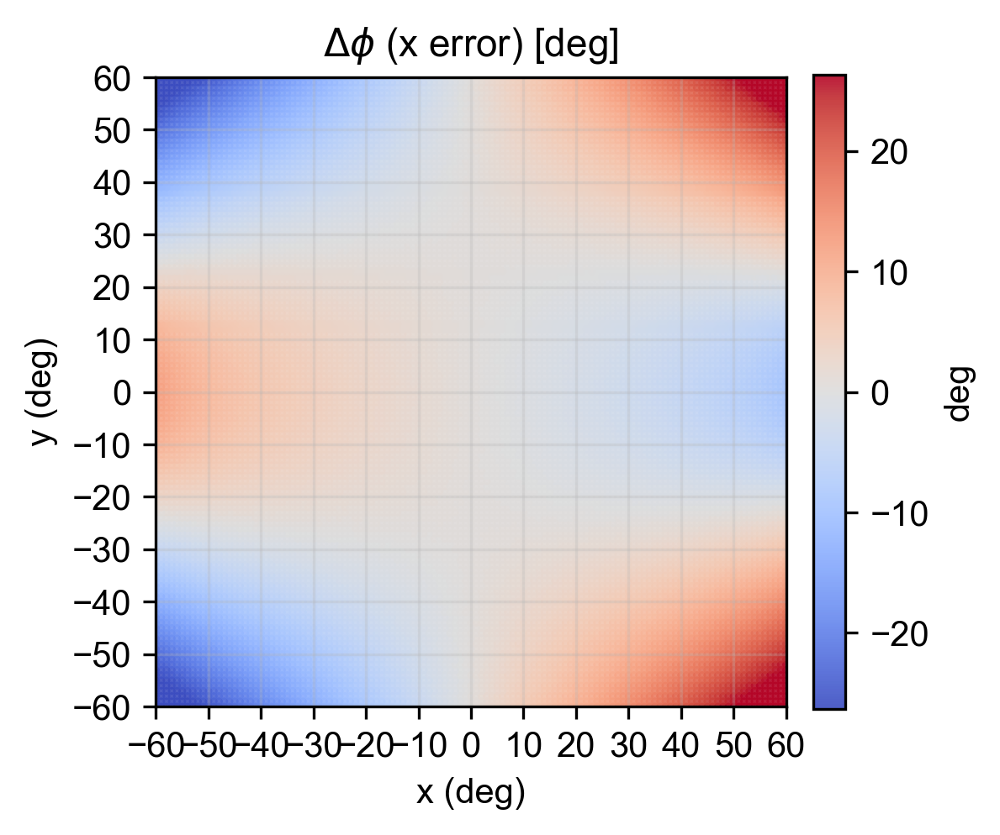

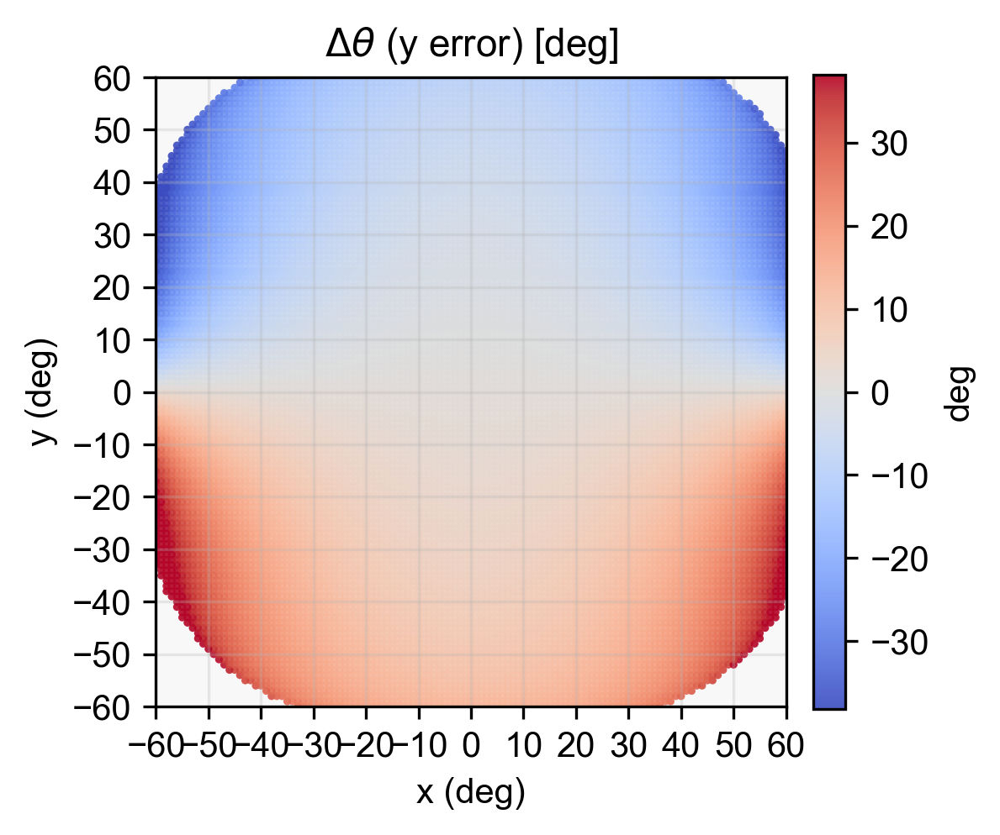

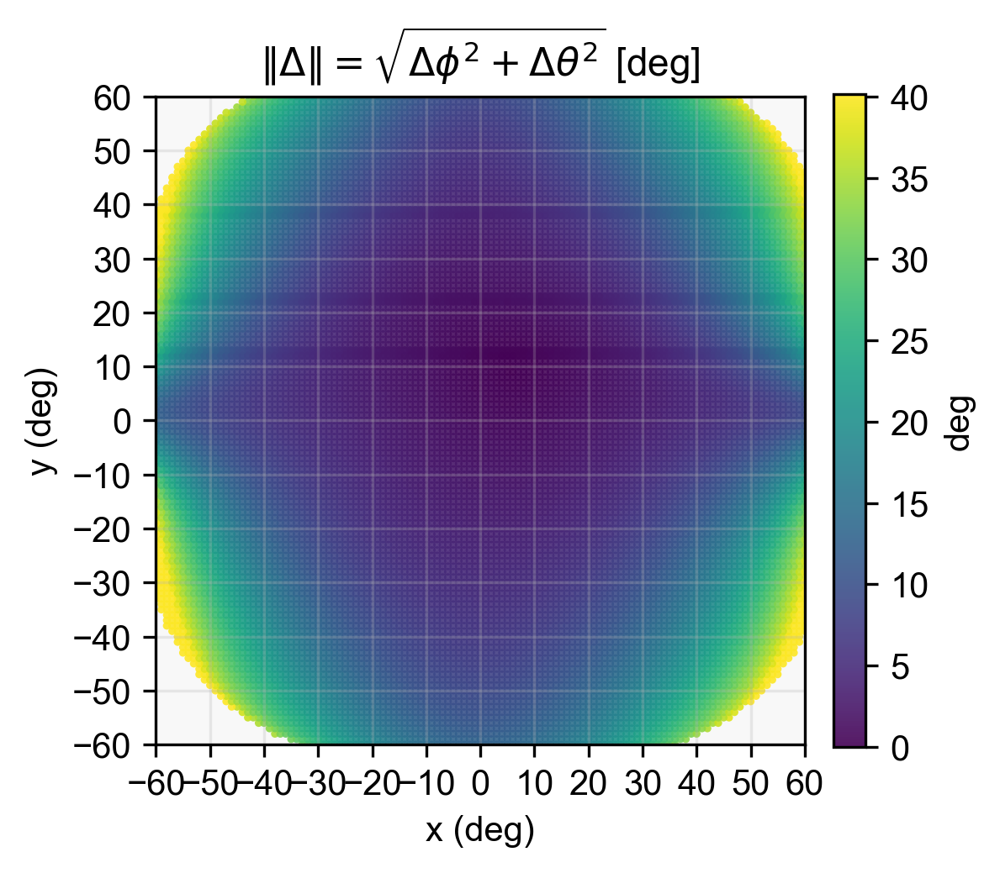

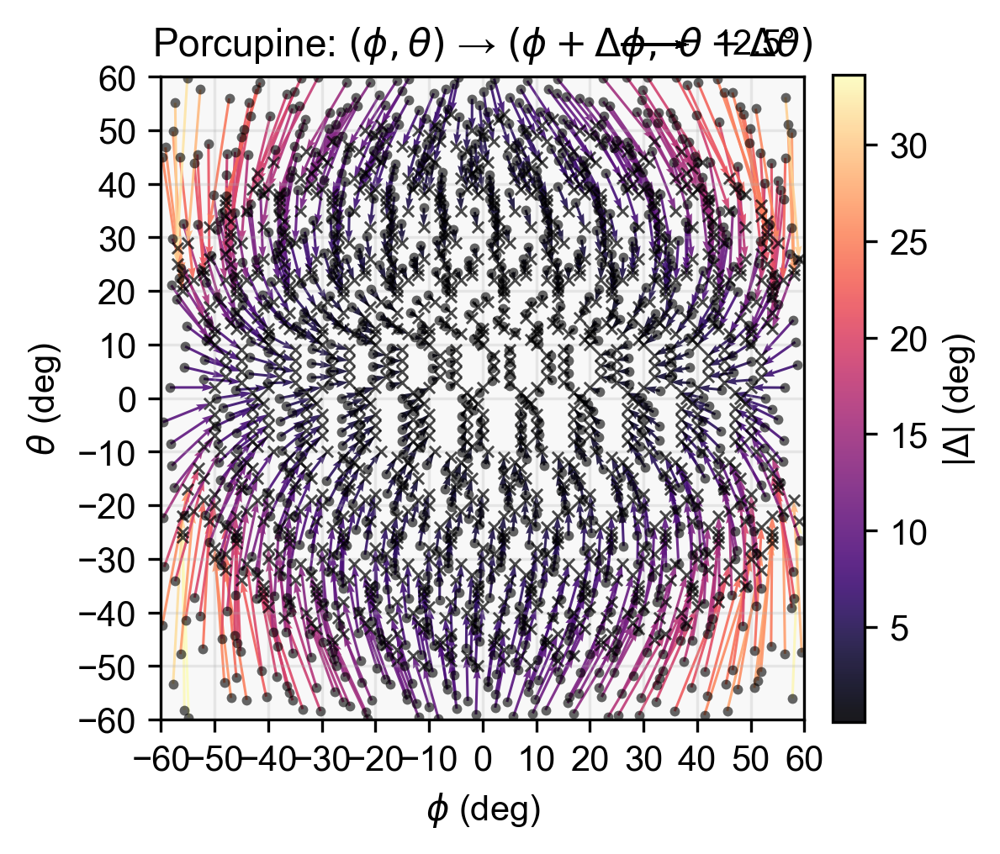

In [86]:
plot_kerr_scatter_grids(
    kerr_df,
    grid_limits=(-60,60,-60,60),
    grid_step=10,
    point_size=5,
    quiver_decim=10,            # thin arrows if dense
    quiver_scale=1.0,          # 1.0 → 1 deg = 1 axis unit
    export_dir=None,
    export_prefix=None,
    save=False,
    show=True
)